In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy.external as sce
import anndata
import harmonypy as hm
import os
from scipy.sparse import csr_matrix #für die sparse matrix
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)
from scipy import stats
random_state=10

Matplotlib created a temporary cache directory at /tmp/matplotlib-lyf2o6fo because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.24.4 scipy==1.11.3 pandas==2.2.3 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.11.6 pynndescent==0.5.13


In [3]:
adata=sc.read_h5ad("/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/Baboon_Myeloids/Baboon_Macrophages_Only_Without_RO_RAW_leiden_named_07.h5ad")

In [4]:
adata

AnnData object with n_obs × n_vars = 9448 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status'
    var: 'Average_expression'
    uns: 'Sample_ID_colors'

normalizing counts per cell
    finished (0:00:00)


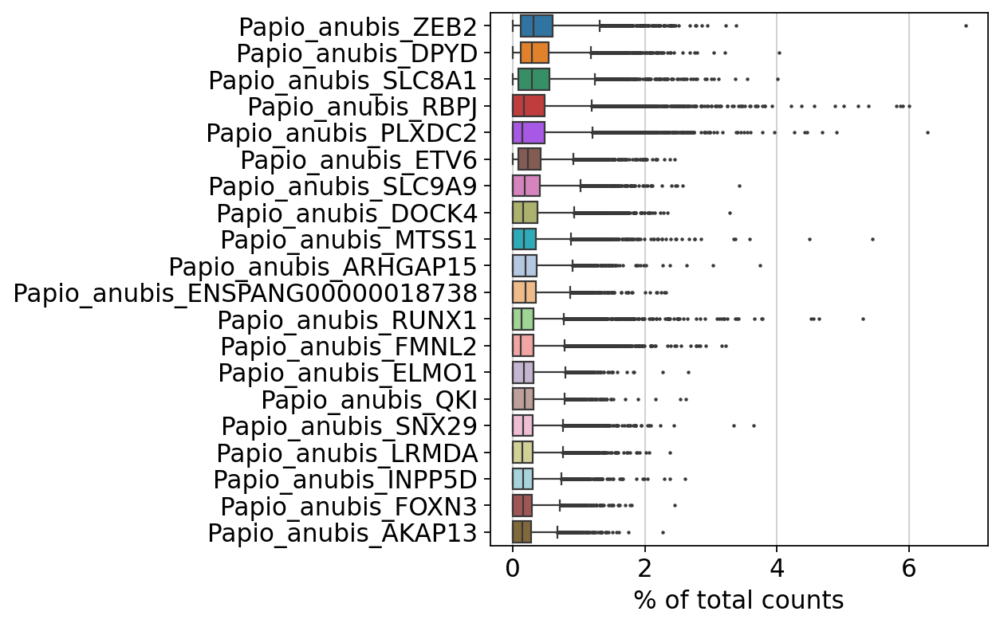

In [5]:
sc.pl.highest_expr_genes(adata, n_top=20)

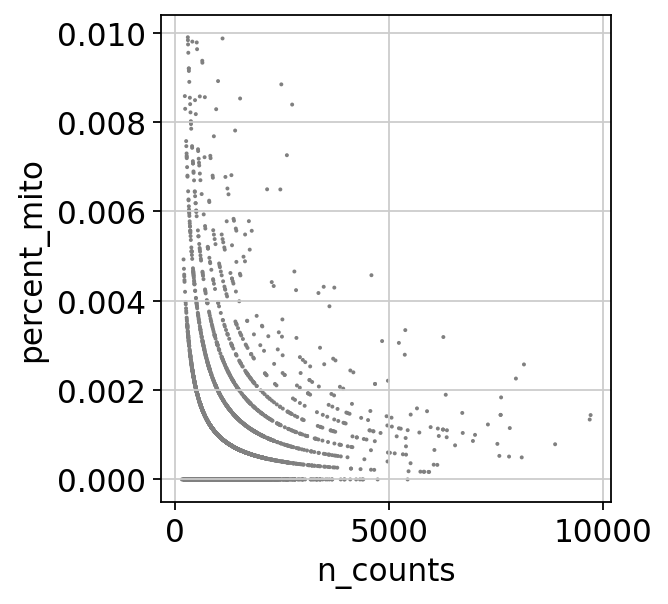

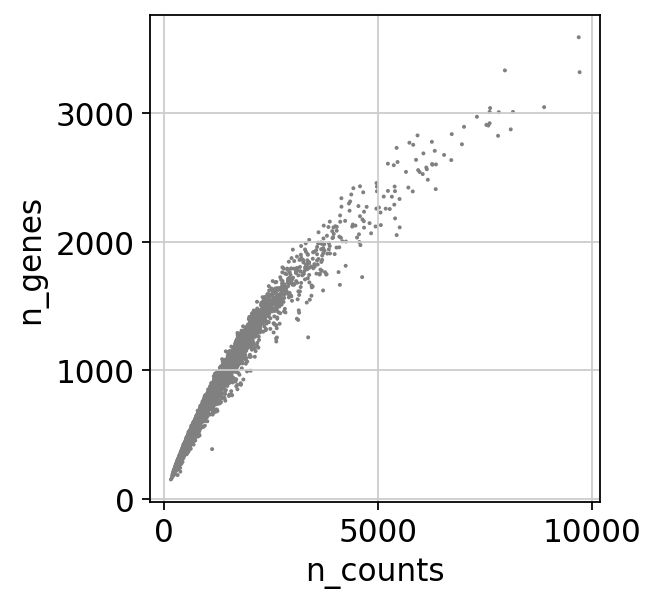

In [6]:
sc.pl.scatter(adata, x="n_counts", y="percent_mito")
sc.pl.scatter(adata, x="n_counts", y="n_genes")

In [7]:
adata = adata[adata.obs.n_genes <1500, :]
adata = adata[adata.obs.n_counts_Papio_anubis > 100, :]
#adata = adata[adata.obs.percent_mito < 5, :].copy()

In [8]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [9]:
sc.pp.log1p(adata)

In [10]:
adata

AnnData object with n_obs × n_vars = 9064 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status'
    var: 'Average_expression'
    uns: 'Sample_ID_colors', 'log1p'

In [11]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


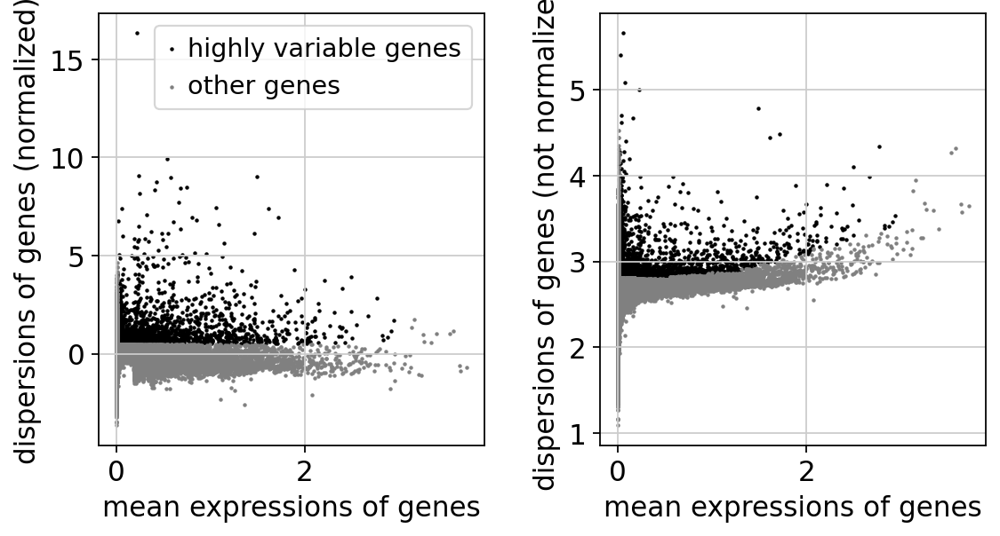

In [12]:
sc.pl.highly_variable_genes(adata)

In [13]:
adata.raw = adata

In [14]:
adata = adata[:, adata.var.highly_variable]

In [15]:
adata.var.highly_variable_baboon=[q & w for q,w in zip(adata.var.highly_variable, ["Papio_anubis" in i for i in adata.var.index])]

In [16]:
adata = adata[:, adata.var.highly_variable_baboon]

In [17]:
np.unique([i[0:10] for i in adata.var.index], return_counts=True)

(array(['Papio_anub'], dtype='<U10'), array([2286]))

In [18]:
#sc.pp.regress_out(adata, ['n_counts'])

In [19]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [20]:
adata

AnnData object with n_obs × n_vars = 9064 × 2286
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'log1p', 'hvg'

# PCA

In [21]:
sc.tl.pca(adata, svd_solver="arpack")

computing PCA
    with n_comps=50
    finished (0:00:01)


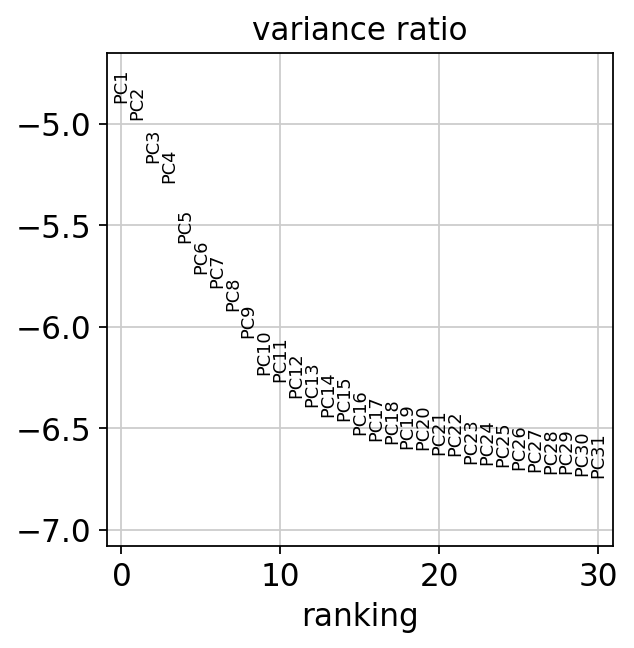

In [22]:
sc.pl.pca_variance_ratio(adata, log=True)

In [23]:
adata

AnnData object with n_obs × n_vars = 9064 × 2286
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [24]:
um_pcs=29
pca=adata.obsm['X_pca']
meta_data=adata.obs
adata_harmony=adata.copy()

In [25]:
ho=hm.run_harmony(pca, meta_data, ['Sample_ID'],
                  epsilon_harmony=-float('Inf'), epsilon_cluster=-float('Inf'),
                  random_state=10)

2025-05-19 15:06:08,556 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-19 15:06:11,831 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-19 15:06:11,878 - harmonypy - INFO - Iteration 1 of 10
2025-05-19 15:06:13,358 - harmonypy - INFO - Iteration 2 of 10
2025-05-19 15:06:14,795 - harmonypy - INFO - Iteration 3 of 10
2025-05-19 15:06:16,226 - harmonypy - INFO - Iteration 4 of 10
2025-05-19 15:06:17,656 - harmonypy - INFO - Iteration 5 of 10
2025-05-19 15:06:19,091 - harmonypy - INFO - Iteration 6 of 10
2025-05-19 15:06:20,540 - harmonypy - INFO - Iteration 7 of 10
2025-05-19 15:06:21,974 - harmonypy - INFO - Iteration 8 of 10
2025-05-19 15:06:23,407 - harmonypy - INFO - Iteration 9 of 10
2025-05-19 15:06:24,835 - harmonypy - INFO - Iteration 10 of 10
2025-05-19 15:06:26,267 - harmonypy - INFO - Stopped before convergence


In [26]:
res=pd.DataFrame(ho.Z_corr)
res=res.T
adata.obsm['X_pca']=res.values

In [ ]:
######### This is the path to the old object that was created without proliferation Myeloids #########

#adata.write("/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/Baboon_Macrophages/Baboon_MPs_Preprocessed_Harmonized_Without_RO.h5ad")

# Restart from here

In [5]:
adata=sc.read_h5ad("/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/FINAL_Objects_Annotated_Without_RO/NEWFINAL_Baboon_Macrophages_Annotated_Without_RO_250519.h5ad")

In [82]:
# Annotated object: fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/FINAL_Objects_Annotated_Without_RO/FINAL_Baboon_Macrophages_Annotated_Without_RO.h5ad

#adata.write("/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/FINAL_Objects_Annotated_Without_RO/NEWFINAL_Baboon_Macrophages_Annotated_Without_RO_250519.h5ad")

In [6]:
adata

AnnData object with n_obs × n_vars = 9064 × 2286
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'leiden_06', 'leiden_07', 'leiden_08', 'leiden_09', 'leiden_10', 'leiden_11', 'MP_named_07', 'MP_named_08', 'MP_named_10', 'new_endpoints'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'MP_named_07_colors', 'MP_named_08_colors', 'MP_named_10_colors', 'Sample_ID_colors', 'hvg', 'leiden_06', 'leiden_06_colors', 'leiden_07

In [7]:
um_pcs=29

In [8]:
sc.pp.neighbors(adata, n_neighbors=25, n_pcs=um_pcs)

computing neighbors
    using 'X_pca' with n_pcs = 29


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:26)


In [9]:
sc.tl.umap(adata, min_dist= 0.05,spread=2.0)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


running Leiden clustering
    finished: found 8 clusters and added
    'leiden_06', the cluster labels (adata.obs, categorical) (0:00:00)


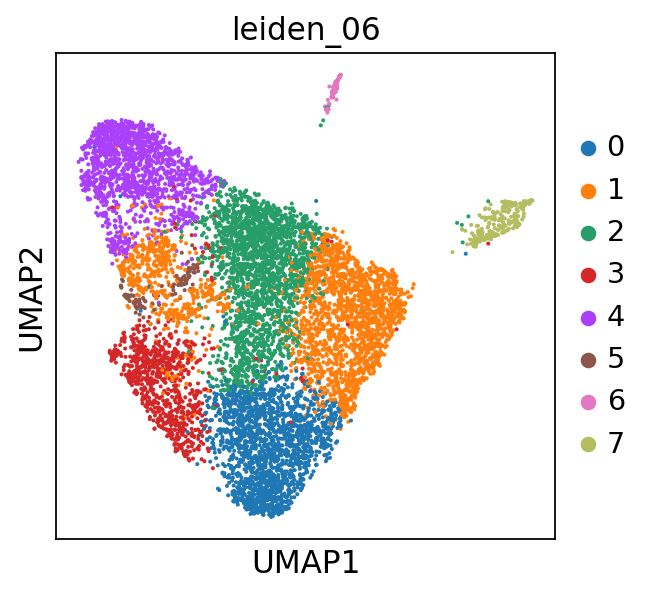

running Leiden clustering
    finished: found 8 clusters and added
    'leiden_07', the cluster labels (adata.obs, categorical) (0:00:00)


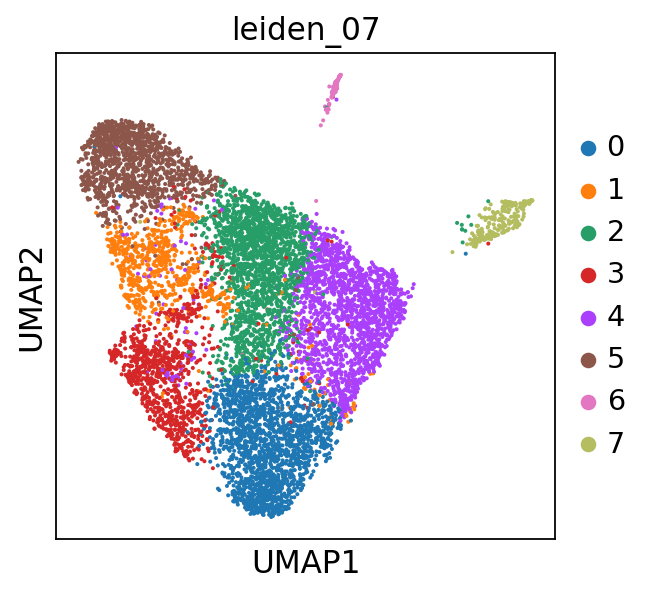

running Leiden clustering
    finished: found 8 clusters and added
    'leiden_08', the cluster labels (adata.obs, categorical) (0:00:00)


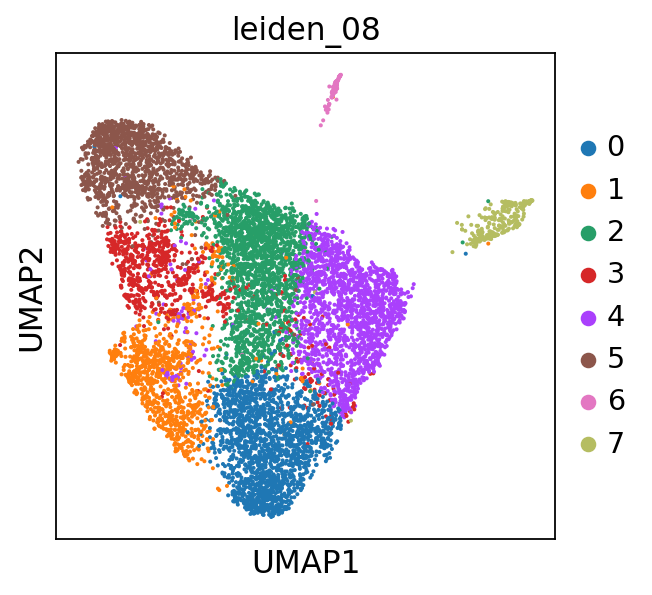

running Leiden clustering
    finished: found 9 clusters and added
    'leiden_09', the cluster labels (adata.obs, categorical) (0:00:00)


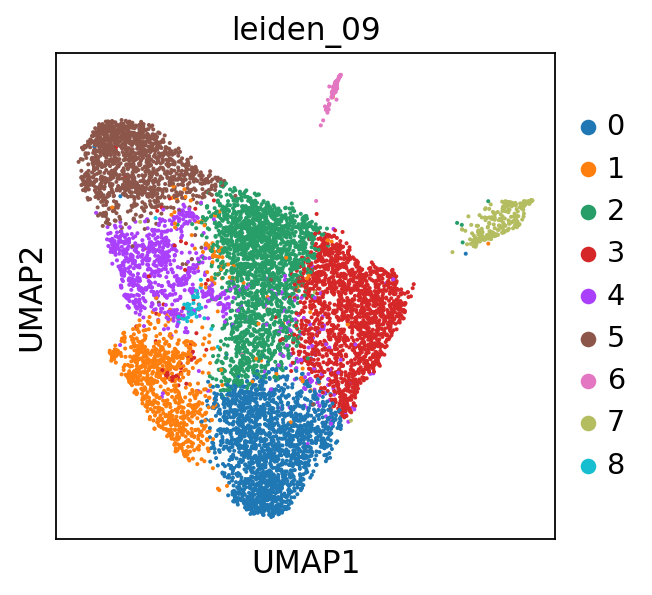

running Leiden clustering
    finished: found 9 clusters and added
    'leiden_10', the cluster labels (adata.obs, categorical) (0:00:00)


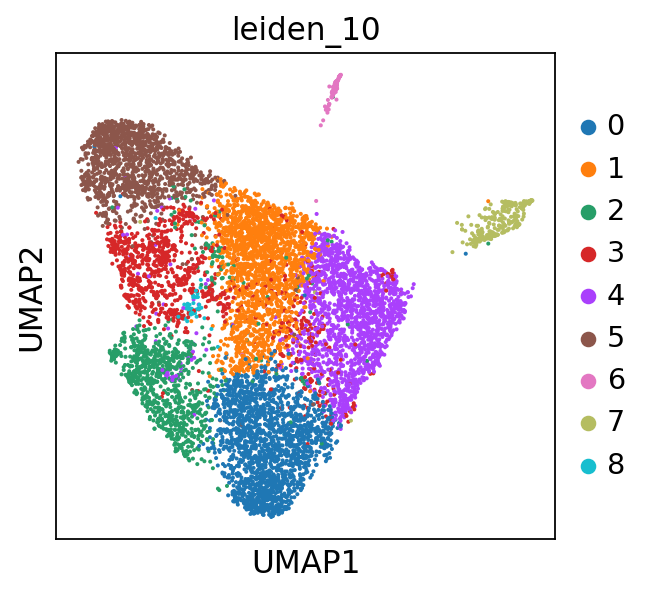

In [10]:
sc.tl.leiden(
    adata,
    resolution=0.6,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
    key_added="leiden_06"
)
sc.pl.umap(adata, color=["leiden_06"])

sc.tl.leiden(
    adata,
    resolution=0.7,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
    key_added="leiden_07"
)
sc.pl.umap(adata, color=["leiden_07"])

sc.tl.leiden(
    adata,
    resolution=0.8,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
    key_added="leiden_08"
)
sc.pl.umap(adata, color=["leiden_08"])

sc.tl.leiden(
    adata,
    resolution=0.9,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
    key_added="leiden_09"
)
sc.pl.umap(adata, color=["leiden_09"])

sc.tl.leiden(
    adata,
    resolution=1.0,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
    key_added="leiden_10"
)
sc.pl.umap(adata, color=["leiden_10"])



In [ ]:
#sc.tl.rank_genes_groups(adata, 'leiden_06')
#sc.pl.rank_genes_groups_matrixplot(adata, n_genes=3)

In [9]:
sc.settings.verbosity = 2  # reduce the verbosity

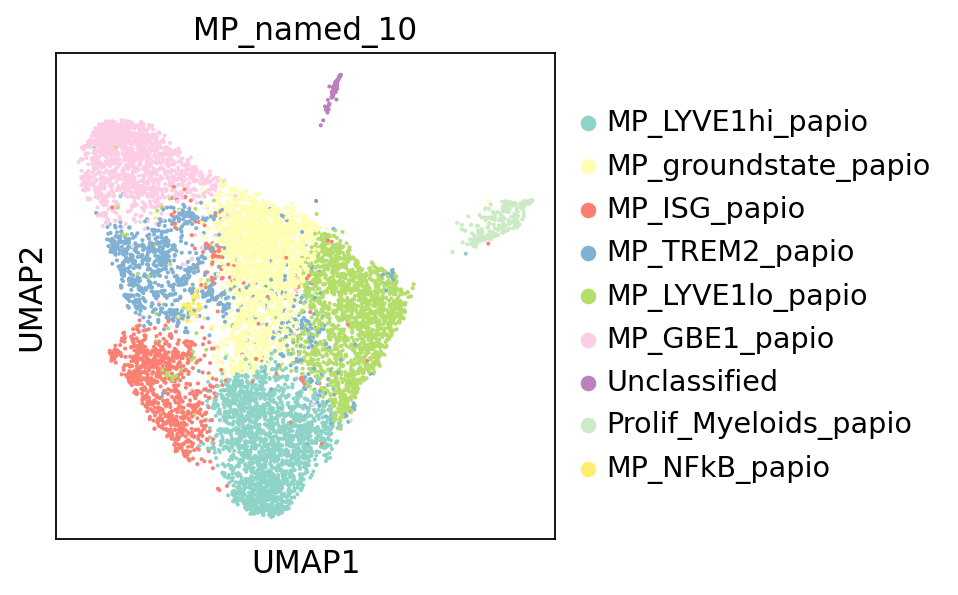

In [58]:
cluster_map = {
    "0": "MP_LYVE1hi_papio",
    "1": "MP_groundstate_papio",
    "2": "MP_ISG_papio",
    "3": "MP_TREM2_papio",
    "4": "MP_LYVE1lo_papio",
    "5": "MP_GBE1_papio",
    "6": "Unclassified",
    "7": "Prolif_Myeloids_papio",
    "8": "MP_NFkB_papio",
    # Add more mappings as needed
}

# Create a new column with the renamed clusters
adata.obs["MP_named_10"] = adata.obs["leiden_10"].map(cluster_map)

# Visualize the UMAP with the new cluster names
sc.pl.umap(adata, color=["MP_named_10"])



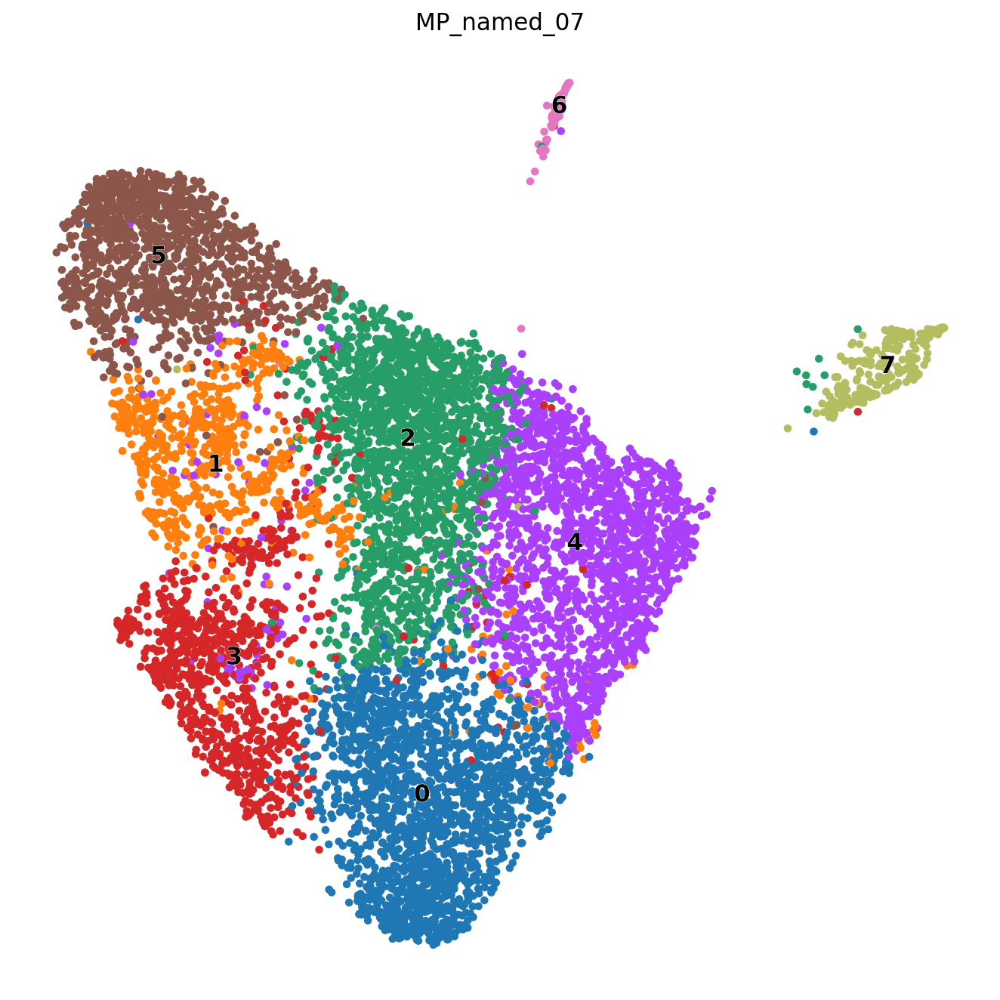

In [11]:
import matplotlib.pyplot as plt
import scanpy as sc

# Set the figure size
fig, ax = plt.subplots(figsize=(8.5, 8.5))

# Call sc.pl.umap with the specified parameters
sc.pl.umap(adata, 
           color=["MP_named_07"], 
           frameon=False, 
           legend_loc='on data', 
           legend_fontoutline=0.5,
           size=90,
           legend_fontsize=14,
           ax=ax,
           show=False)  # Use show=False to allow further modifications

# Add axis labels
ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')

# Show tick labels
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


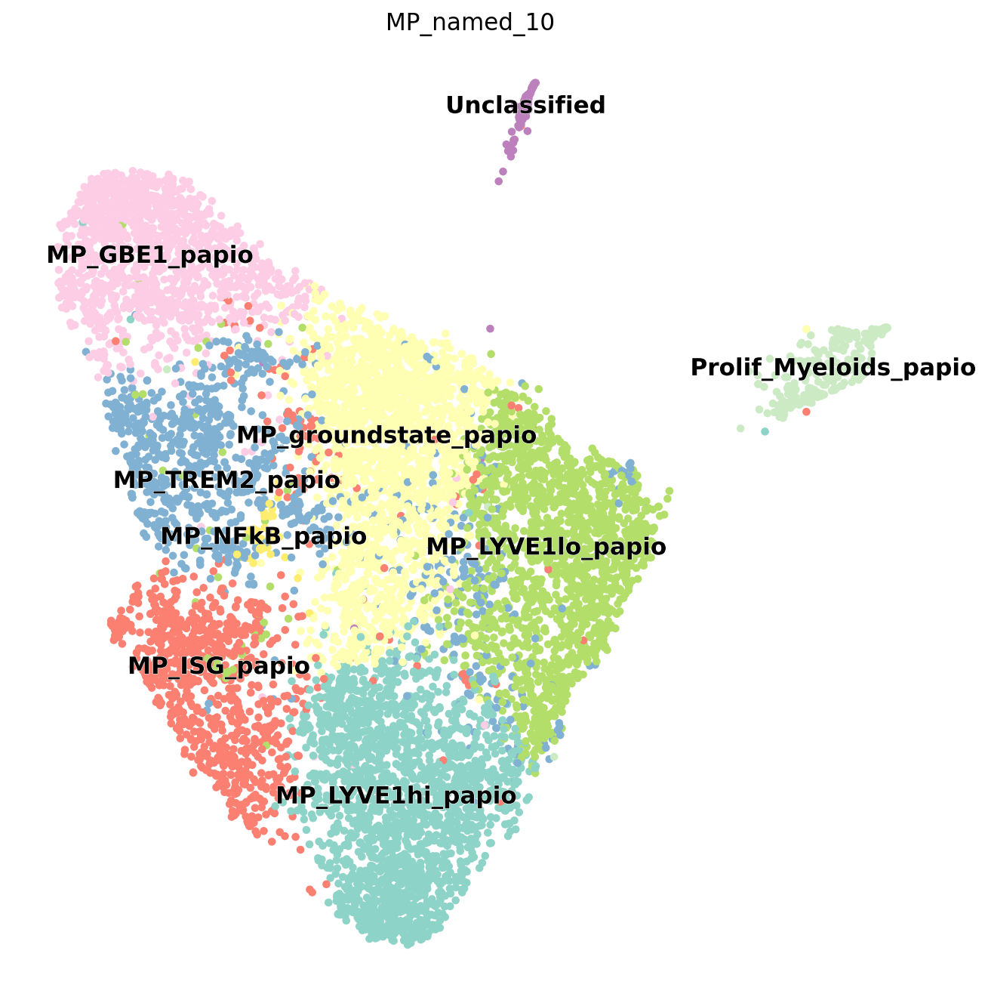

In [11]:
import matplotlib.pyplot as plt
import scanpy as sc

# Set the figure size
fig, ax = plt.subplots(figsize=(8.5, 8.5))

# Call sc.pl.umap with the specified parameters
sc.pl.umap(adata, 
           color=["MP_named_10"], 
           frameon=False, 
           legend_loc='on data', 
           legend_fontoutline=0.5,
           size=90,
           legend_fontsize=14,
           palette="Set3", 
           ax=ax,
           show=False)  # Use show=False to allow further modifications

# Add axis labels
ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')

# Show tick labels
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [ ]:
sc.tl.rank_genes_groups(adata, "MP_named_10", method="wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(adata, "MP_named_10", method="wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

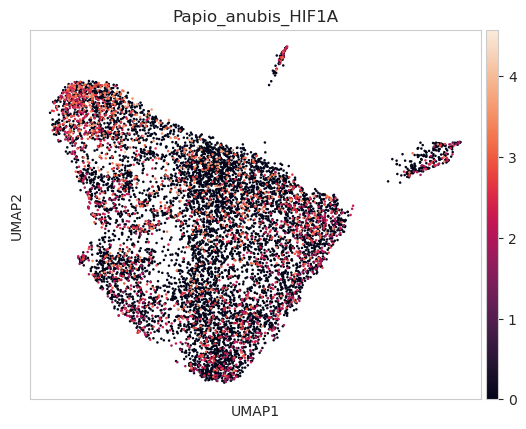

In [33]:
sc.pl.umap(adata, color=["Papio_anubis_HIF1A"])

In [ ]:
MP_GBE1_papio

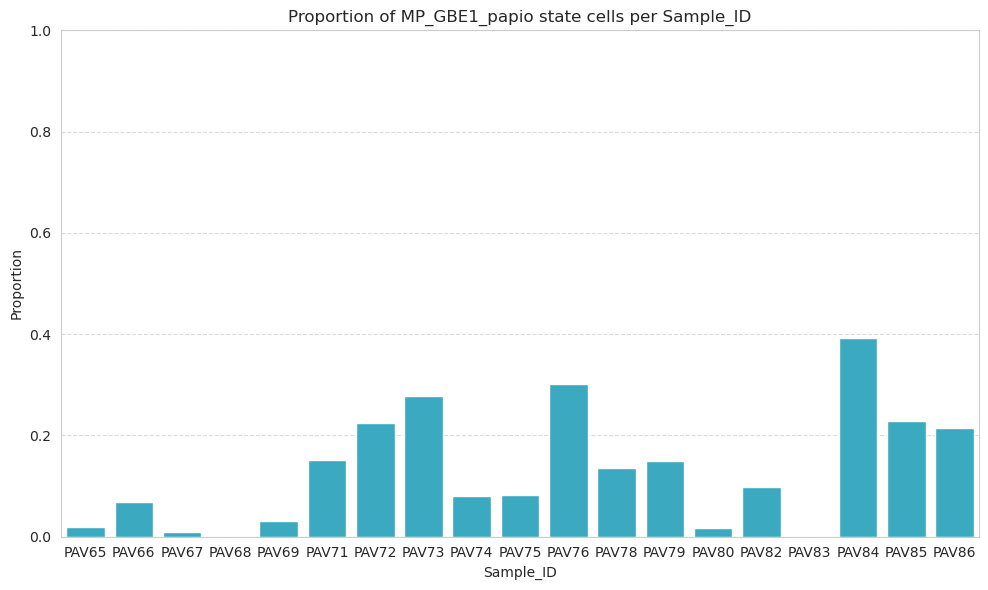

In [39]:
# Step 1: Identify cells that are in the MP_ISG_papio state
adata.obs['is_MP_GBE1_papio'] = (adata.obs['MP_named_10'] == 'MP_GBE1_papio').astype(int)

# Step 2: Group by Sample_ID and calculate proportion of MP_ISG_papio cells
proportions = adata.obs.groupby('Sample_ID')['is_MP_GBE1_papio'].mean()

# Step 3: Create the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=proportions.index, y=proportions.values, color='#25b9d7')
plt.xlabel('Sample_ID')
plt.ylabel('Proportion')
plt.title('Proportion of MP_GBE1_papio state cells per Sample_ID')
plt.ylim(0, 1)  # Set y-axis from 0 to 1 for proportion
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

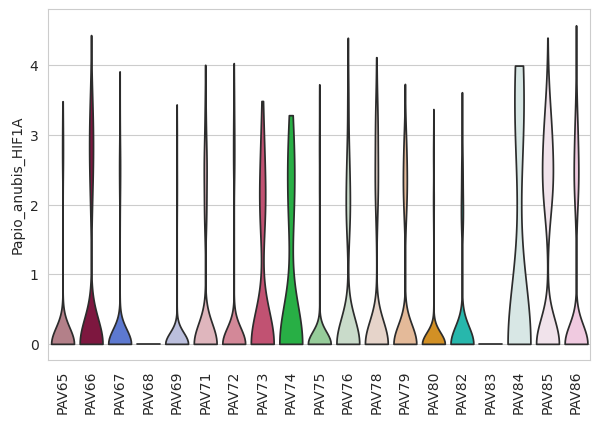

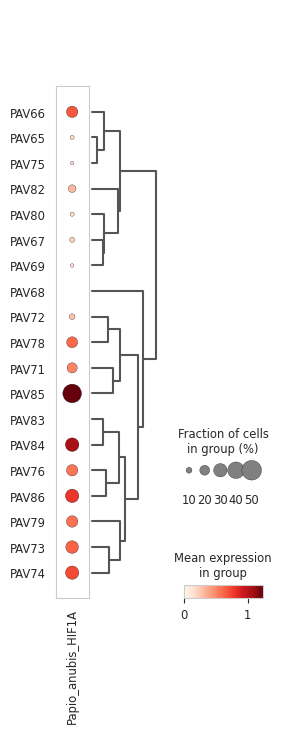

In [41]:
sc.pl.violin(
    adata, 
    keys='Papio_anubis_HIF1A',
    groupby='Sample_ID',
    rotation=90,
    stripplot=False
)

sc.pl.dotplot(
    adata,
    var_names=['Papio_anubis_HIF1A'],
    groupby='Sample_ID',
    dendrogram=True,
    #standard_scale='var'
)

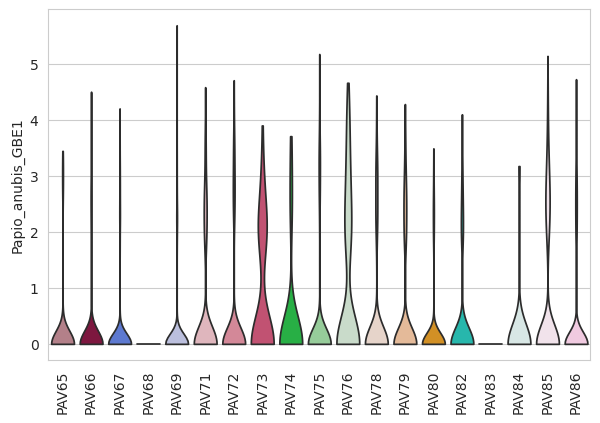

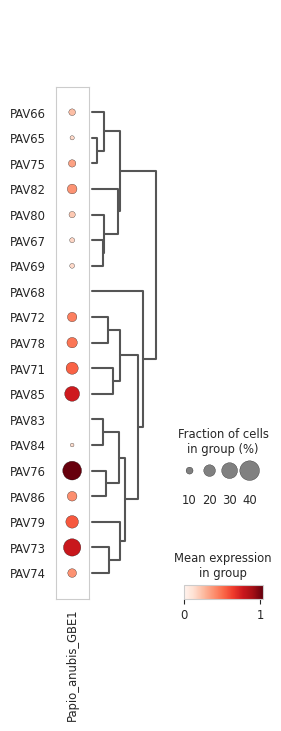

In [40]:
sc.pl.violin(
    adata, 
    keys='Papio_anubis_GBE1',
    groupby='Sample_ID',
    rotation=90,
    stripplot=False
)

sc.pl.dotplot(
    adata,
    var_names=['Papio_anubis_GBE1'],
    groupby='Sample_ID',
    dendrogram=True,
    #standard_scale='var'
)

# ei/eo START 

In [12]:
def filter_by_expression(adata_obj, DE_column, key='rank_genes_groups'):
#adata_obj=fbs_new_harmony.copy()
#key='rank_genes_groups'
#DE_column='leiden'
    def to_tensor(dataframe, columns = [], dtypes = {}, index = False):
        to_records_kwargs = {'index': index}
        if not columns:  # Default to all `dataframe.columns`
            columns = dataframe.columns
        if dtypes:       # Pull in modifications only for dtypes listed in `columns`
            to_records_kwargs['column_dtypes'] = {}
            for column in dtypes.keys():
                if column in columns:
                    to_records_kwargs['column_dtypes'].update({column: dtypes.get(column)})
        return dataframe[columns].to_records(**to_records_kwargs)
    gene_names = pd.DataFrame(adata_obj.uns[key]['names'])
    fraction_in_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    fraction_notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    in_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allin_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allnotin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    # Create a Adata raw with raw in .X -> We might remove this step - redundant!
    dummy=anndata.AnnData(X=adata_obj.raw.X,
                   var=adata_obj.raw.var,
                   obs=adata_obj.obs)
    # We split the adata by Cell-type. Genes are ordered according to ranks from DEgene analysis
    dummy_split=[dummy[dummy.obs[DE_column].isin([i]),
                  gene_names[i]] for i in gene_names.columns]
    dummy_split_adatasize=[i.shape[0] for i in dummy_split] # How many cells we have in-cluster
    dummy_outcluster=[dummy[~dummy.obs[DE_column].isin([i]),
                       gene_names[i]] for i in gene_names.columns]
    dummy_split_adatasize_outcluster=[i.shape[0] for i in dummy_outcluster] # How many cells we have in out-cluster
    for adata, sizeof_adata, adata_outcluster, sizeof_adata_outcluster in zip(dummy_split, dummy_split_adatasize, 
                                                     dummy_outcluster, dummy_split_adatasize_outcluster):
        cluster_number=[(adata.obs[DE_column].unique()).tolist()][0]
        #incluster_rows, incluster_cols=adata.X.nonzero()
        #https://stackoverflow.com/questions/3797158/counting-non-zero-elements-within-each-row-and-within-each-column-of-a-2d-numpy
        #incluster_counts = [len(np.where(incluster_cols==i)[0]) for i in range(0,adata.shape[1])]
        incluster_counts=np.diff(adata.X.tocsc().indptr)
        percent_expression_incluster=np.array(incluster_counts)/sizeof_adata 
        fraction_in_cluster_matrix[cluster_number[0]]=percent_expression_incluster
        #outcluster_rows, outcluster_cols=adata_outcluster.X.nonzero()
        #outcluster_counts = [len(np.where(outcluster_cols==i)[0]) for i in range(0,adata_outcluster.shape[1])]
        outcluster_counts=np.diff(adata_outcluster.X.tocsc().indptr)
        percent_expression_outcluster=np.array(outcluster_counts)/sizeof_adata_outcluster 
        fraction_notin_cluster_matrix[cluster_number[0]]=percent_expression_outcluster
        # Expression_all in cluster
        allin_cluster_expr_matrix[cluster_number[0]]=np.squeeze(np.asarray(adata.X.mean(axis=0)))
        allnotin_cluster_matrix[cluster_number[0]]=np.squeeze(np.asarray(adata_outcluster.X.mean(axis=0)))
    # Generate the last table results
    result = adata_obj.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result['pi'] = to_tensor(fraction_in_cluster_matrix)
    result['po'] = to_tensor(fraction_notin_cluster_matrix)
    result['ei'] = to_tensor(allin_cluster_expr_matrix)
    result['eo'] = to_tensor(allnotin_cluster_matrix)
    results =pd.DataFrame(
        {group + '_' + key[:2]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges', 'pi', 'po', "ei", "eo"]})
    return results

In [13]:
sc.tl.rank_genes_groups(adata, groupby='MP_named_10', method='wilcoxon')

ranking genes
    finished (0:00:16)


In [14]:
df=filter_by_expression(adata, 'MP_named_10', key='rank_genes_groups')


In [15]:
df=filter_by_expression(adata, 'MP_named_10', key='rank_genes_groups')

In [16]:
def makevector_topmarkers(adata, top_n, ldFC_cutoff=0.5, pvals_adj_cutoff=10**-30, expression_in=0.7, expression_out=0.3): 
    results=adata.uns['rank_genes_groups']
    clusters = results['names'].dtype.names
    top_genes=[]
    for cluster in clusters:
        topgenes_cluster=results['names'][cluster][np.where((results['logfoldchanges'][cluster]>=ldFC_cutoff) & 
                                                            (results['pvals_adj'][cluster]<(pvals_adj_cutoff)) &
                                                           (results['ei'][cluster]>=expression_in) & 
                                                            (results['eo'][cluster]<=expression_out)
                                                           )][0:top_n]
        top_genes.extend(topgenes_cluster)
    return(top_genes)

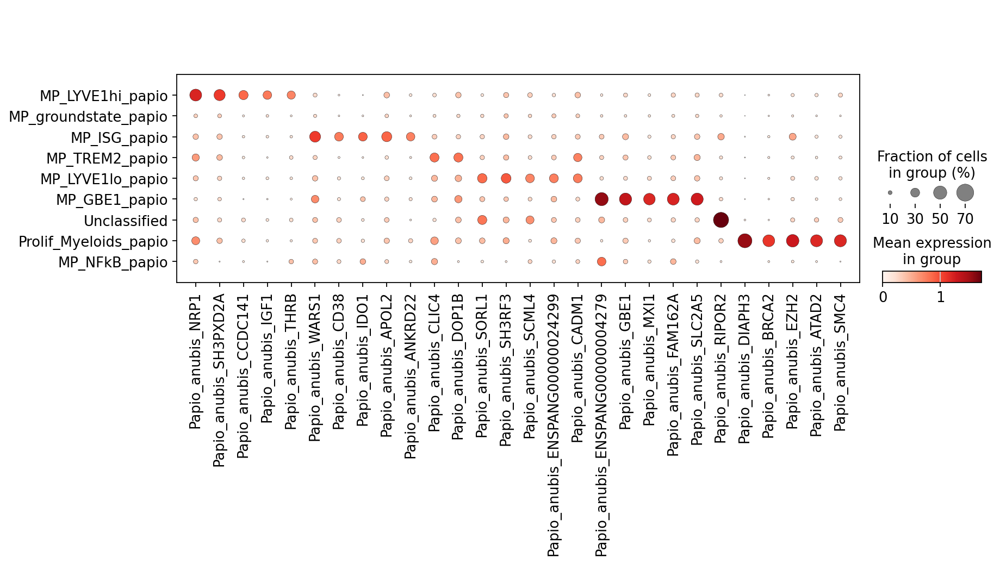

In [21]:
sc.pl.dotplot(adata,
              var_names=makevector_topmarkers(adata, 5, 
                                            ldFC_cutoff=0.5, 
                                            pvals_adj_cutoff=1e-10,
                                            expression_in=0.7,
                                            expression_out=0.3),
              groupby="MP_named_10")

# ei/eo END 

# Annotation Results

# Macrophages annotation

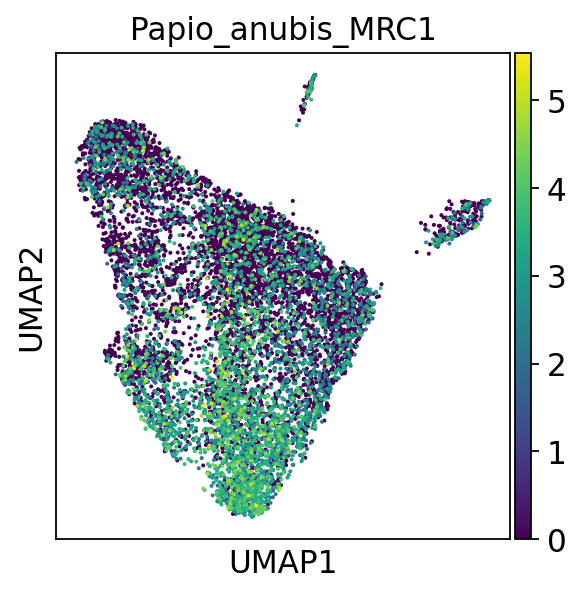

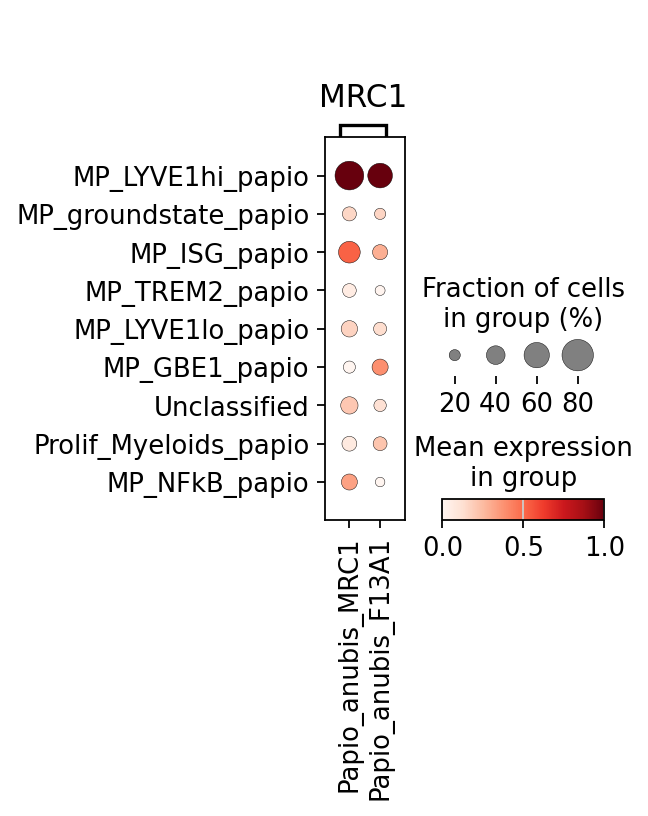

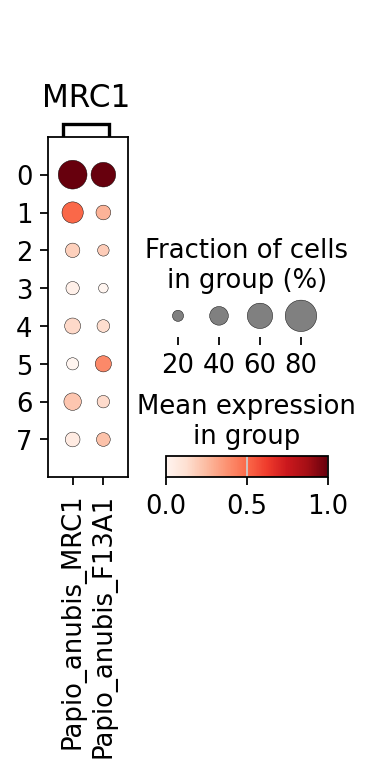

In [21]:
sc.pl.umap(adata, color=["Papio_anubis_MRC1"])

marker_genes={ 'MRC1': ["Papio_anubis_MRC1", "Papio_anubis_F13A1"]
 }             
cell_types = ['MRC1']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"
)

sc.pl.dotplot(
    adata,
    groupby="MP_named_08",
    var_names=marker_genes,
    standard_scale="var"
)

# PIK3CB/GBE1 Cluster

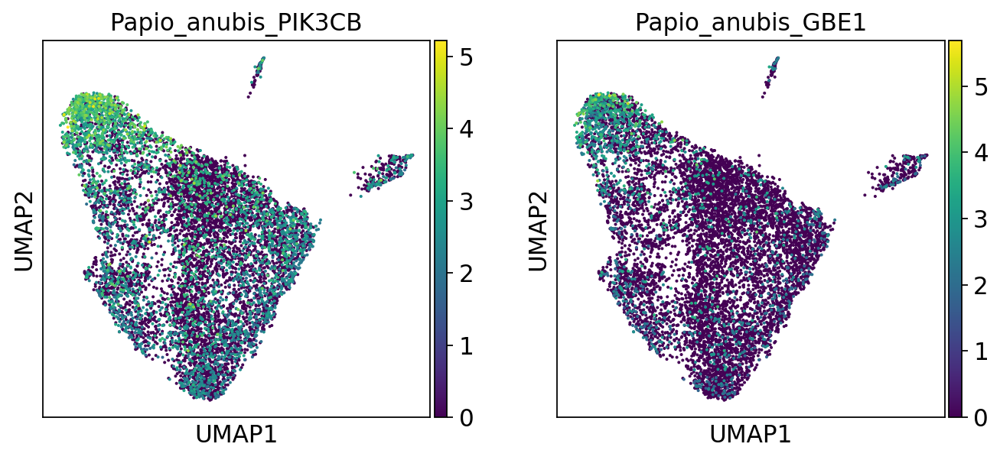

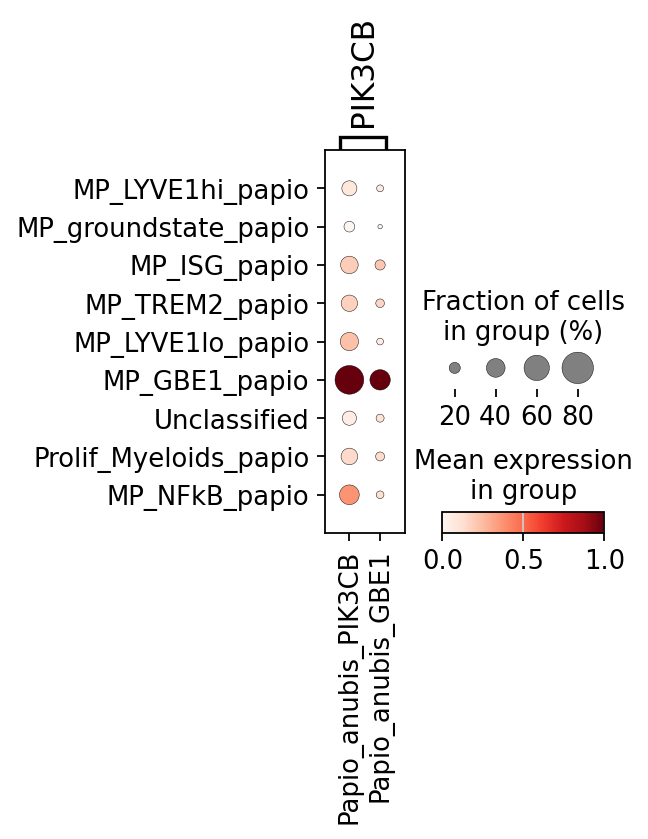

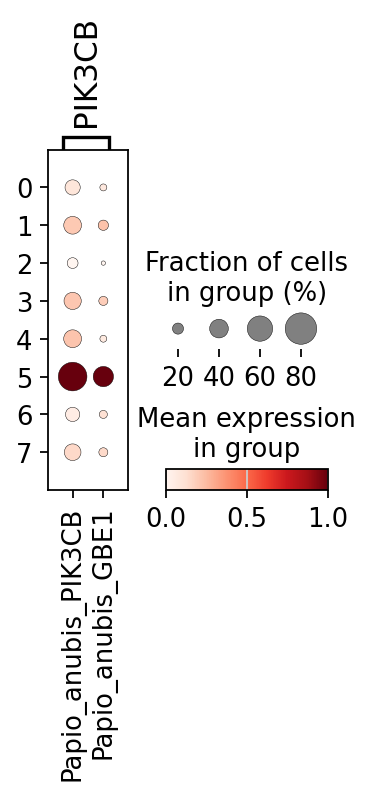

In [22]:
sc.pl.umap(adata, color=["Papio_anubis_PIK3CB", "Papio_anubis_GBE1"])

marker_genes={ 'PIK3CB': ["Papio_anubis_PIK3CB", "Papio_anubis_GBE1"]
 }             
cell_types = ['PIK3CB']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"
)

sc.pl.dotplot(
    adata,
    groupby="MP_named_08",
    var_names=marker_genes,
    standard_scale="var"
)

In [ ]:
# Hypoxia Macrophages

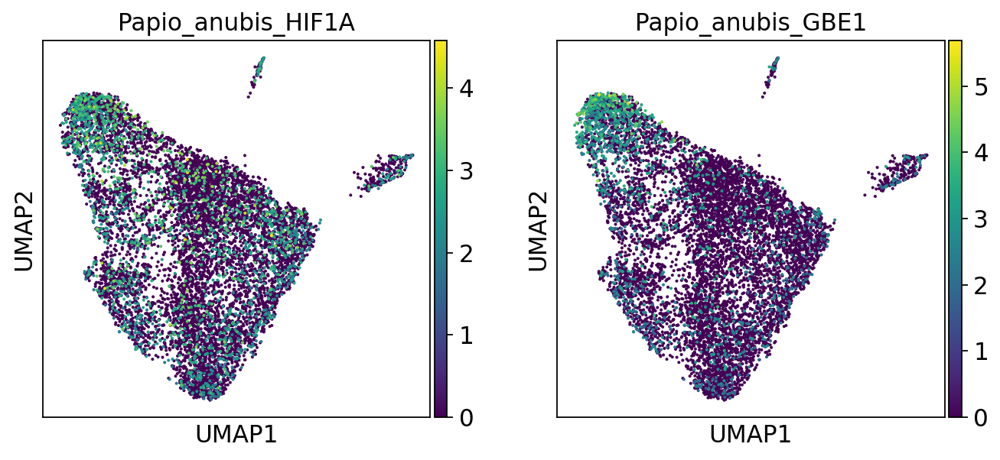

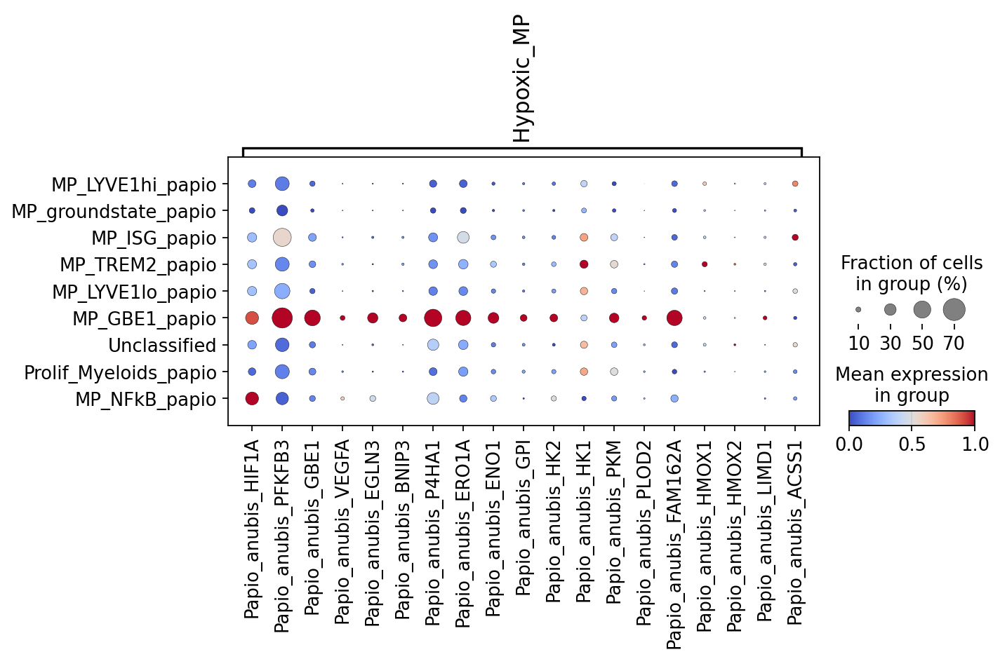

In [23]:
sc.pl.umap(adata, color=["Papio_anubis_HIF1A", "Papio_anubis_GBE1"])

marker_genes={ 'Hypoxic_MP': ["Papio_anubis_HIF1A", "Papio_anubis_PFKFB3", "Papio_anubis_GBE1", "Papio_anubis_VEGFA", "Papio_anubis_EGLN3", "Papio_anubis_BNIP3", "Papio_anubis_P4HA1", "Papio_anubis_ERO1A", "Papio_anubis_ENO1", 
                              "Papio_anubis_GPI", "Papio_anubis_HK2","Papio_anubis_HK1", "Papio_anubis_PKM", "Papio_anubis_PLOD2", "Papio_anubis_FAM162A", "Papio_anubis_HMOX1", "Papio_anubis_HMOX2", "Papio_anubis_LIMD1", "Papio_anubis_ACSS1"]
 }             
cell_types = ['Hypoxic_MP']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var",
    cmap="coolwarm"
)

# Excluded genes
# "Papio_anubis_STC2",
#"Papio_anubis_HMOX2",

In [ ]:
VCAN expression 

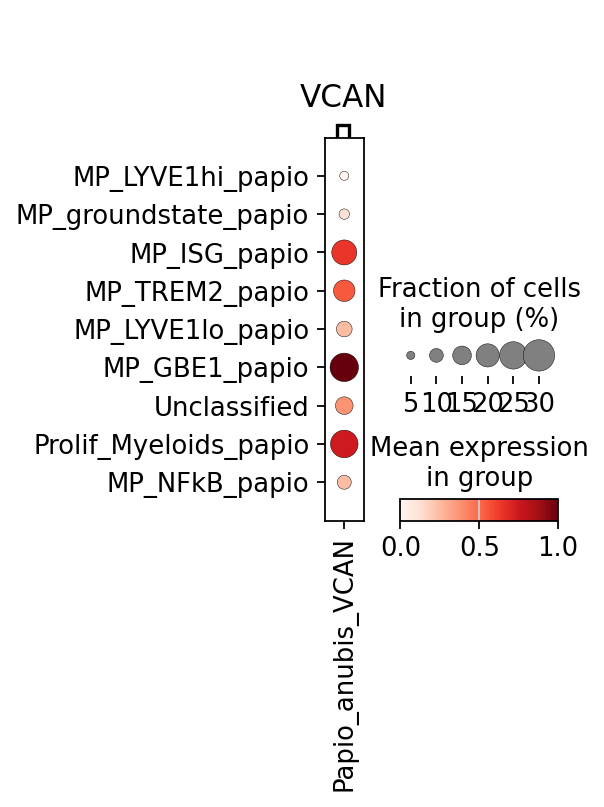

In [30]:
marker_genes={ 'VCAN': ["Papio_anubis_VCAN"]
 }             
cell_types = ['VCAN']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"
)

In [ ]:
NFkB expression

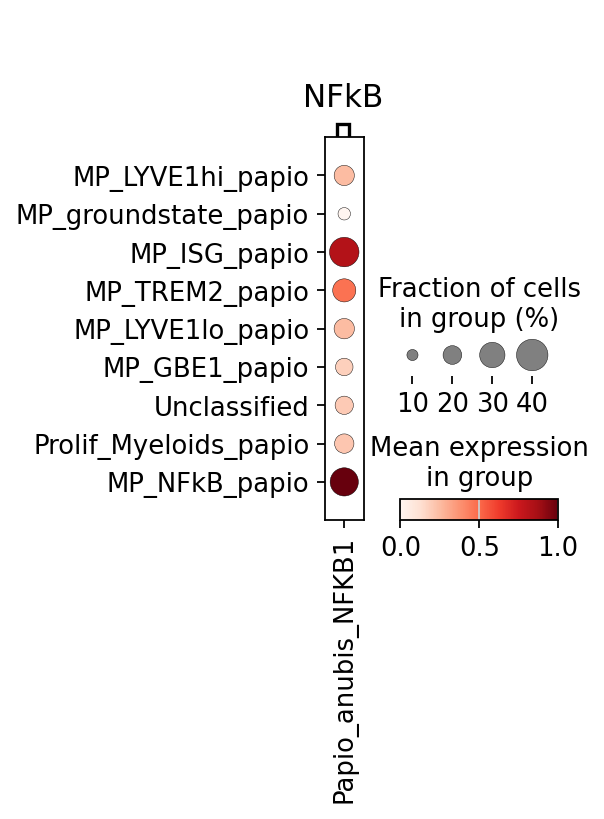

In [29]:
marker_genes={ 'NFkB': ["Papio_anubis_NFKB1"]
 }             
cell_types = ['NFkB']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"
)



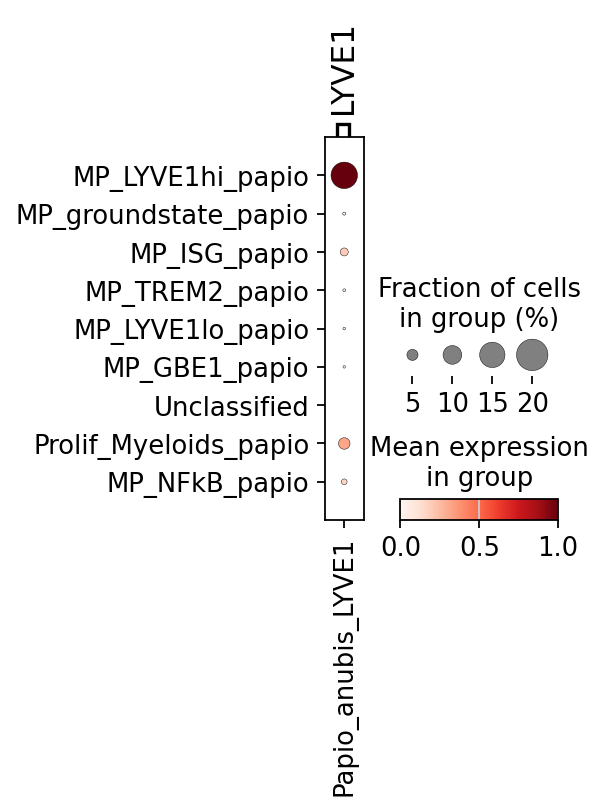

In [28]:
marker_genes={ 'LYVE1': ["Papio_anubis_LYVE1"]
 }             
cell_types = ['LYVE1']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"
)



In [ ]:
CD163 expression 

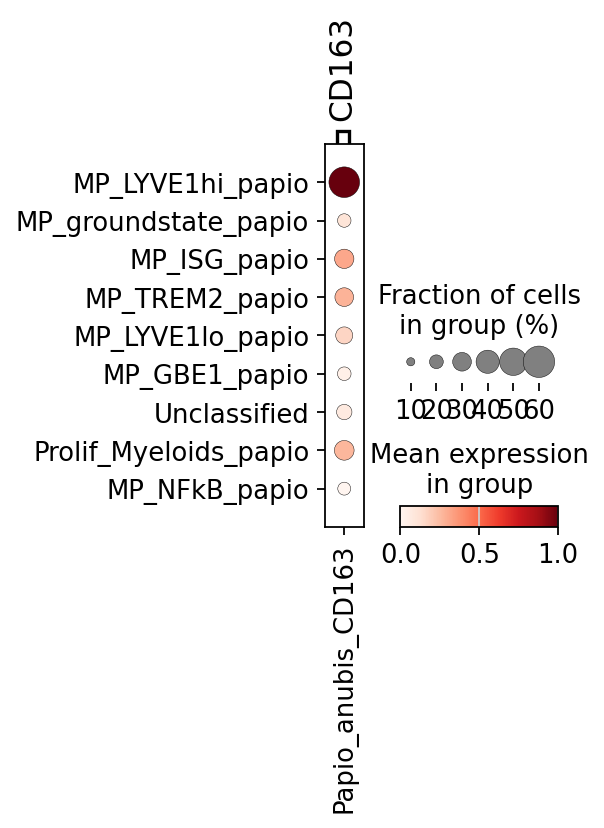

In [32]:
marker_genes={ 'CD163': ["Papio_anubis_CD163"]
 }             
cell_types = ['CD163']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"
)


In [ ]:
FOLR2 expression

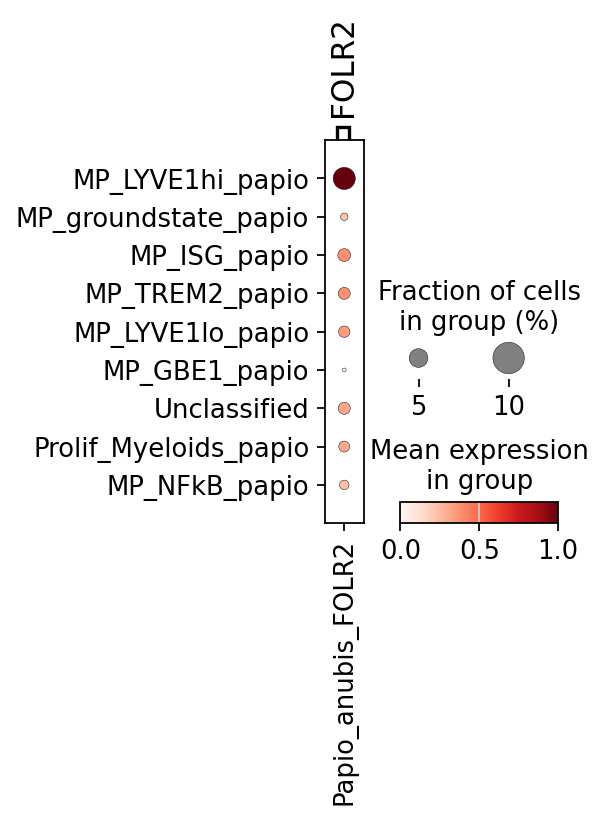

In [33]:
marker_genes={ 'FOLR2': ["Papio_anubis_FOLR2"]
 }             
cell_types = ['FOLR2']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"
)


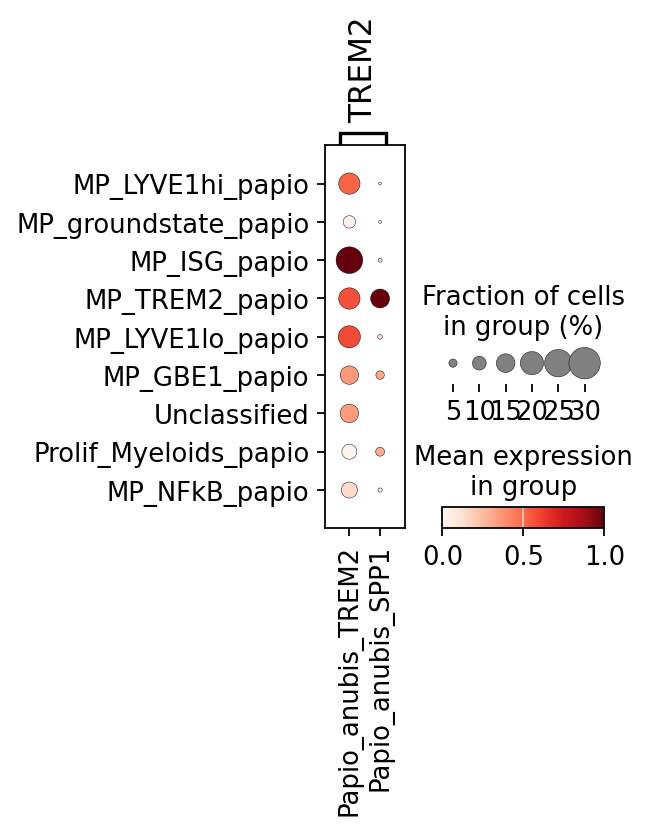

In [34]:
marker_genes={ 'TREM2': ["Papio_anubis_TREM2","Papio_anubis_SPP1"]
 }             
cell_types = ['TREM2']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"
)


# Marker genes from DCM paper

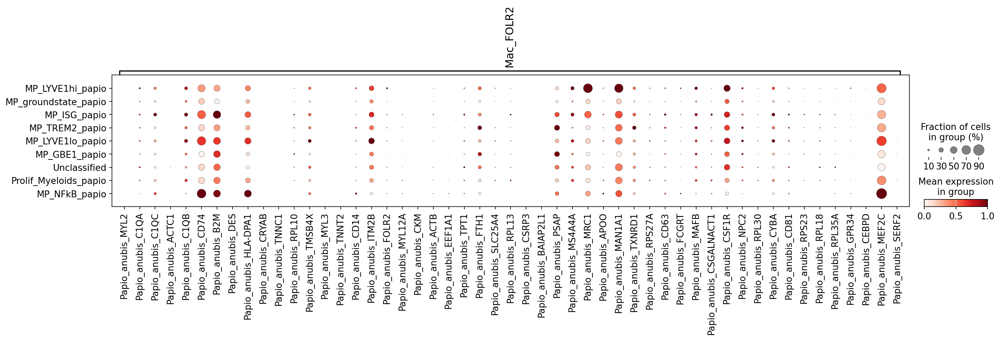

In [35]:
# Macrophages_FOLR2

marker_genes={ 'Mac_FOLR2': ["Papio_anubis_MYL2", "Papio_anubis_C1QA", "Papio_anubis_C1QC", "Papio_anubis_ACTC1", "Papio_anubis_C1QB", "Papio_anubis_CD74", "Papio_anubis_B2M", "Papio_anubis_DES", "Papio_anubis_HLA-DPA1", "Papio_anubis_CRYAB", "Papio_anubis_TNNC1", "Papio_anubis_RPL10", "Papio_anubis_TMSB4X", "Papio_anubis_MYL3", "Papio_anubis_TNNT2", "Papio_anubis_CD14", "Papio_anubis_ITM2B", "Papio_anubis_FOLR2", "Papio_anubis_MYL12A", "Papio_anubis_CKM", "Papio_anubis_ACTB", "Papio_anubis_EEF1A1", "Papio_anubis_TPT1", "Papio_anubis_FTH1", "Papio_anubis_SLC25A4", "Papio_anubis_RPL13", "Papio_anubis_CSRP3", "Papio_anubis_BAIAP2L1", "Papio_anubis_PSAP", "Papio_anubis_MS4A4A", "Papio_anubis_MRC1", "Papio_anubis_APOO", "Papio_anubis_MAN1A1", "Papio_anubis_TXNRD1", "Papio_anubis_RPS27A", "Papio_anubis_CD63", "Papio_anubis_FCGRT", "Papio_anubis_MAFB", "Papio_anubis_CSGALNACT1", "Papio_anubis_CSF1R", "Papio_anubis_NPC2", "Papio_anubis_RPL30", "Papio_anubis_CYBA", "Papio_anubis_CD81", "Papio_anubis_RPS23", "Papio_anubis_RPL18", "Papio_anubis_RPL35A", "Papio_anubis_GPR34", "Papio_anubis_CEBPD", "Papio_anubis_MEF2C", "Papio_anubis_SERF2"],  

 }             
cell_types = ['Mac_FOLR2']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)



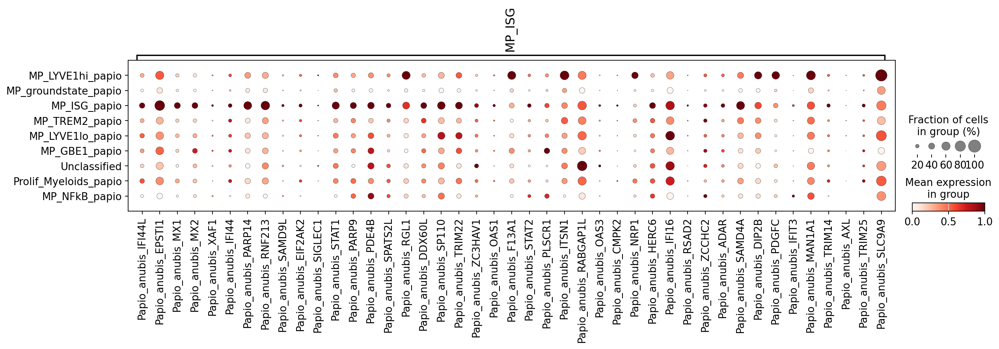

In [36]:
# Macrophages_ISG  -> maybe cluster 1 in MP_named_10

marker_genes={'MP_ISG': ["Papio_anubis_IFI44L", "Papio_anubis_EPSTI1", "Papio_anubis_MX1", "Papio_anubis_MX2", "Papio_anubis_XAF1", "Papio_anubis_IFI44", "Papio_anubis_PARP14", "Papio_anubis_RNF213", "Papio_anubis_SAMD9L", "Papio_anubis_EIF2AK2", "Papio_anubis_SIGLEC1", "Papio_anubis_STAT1", "Papio_anubis_PARP9", "Papio_anubis_PDE4B", "Papio_anubis_SPATS2L", "Papio_anubis_RGL1", "Papio_anubis_DDX60L", "Papio_anubis_SP110", "Papio_anubis_TRIM22", "Papio_anubis_ZC3HAV1", "Papio_anubis_OAS1", "Papio_anubis_F13A1", "Papio_anubis_STAT2", "Papio_anubis_PLSCR1", "Papio_anubis_ITSN1", "Papio_anubis_RABGAP1L", "Papio_anubis_OAS3", "Papio_anubis_CMPK2", "Papio_anubis_NRP1", "Papio_anubis_HERC6", "Papio_anubis_IFI16", "Papio_anubis_RSAD2", "Papio_anubis_ZCCHC2", "Papio_anubis_ADAR", "Papio_anubis_SAMD4A", "Papio_anubis_DIP2B", "Papio_anubis_PDGFC", "Papio_anubis_IFIT3", "Papio_anubis_MAN1A1", "Papio_anubis_TRIM14", "Papio_anubis_AXL", "Papio_anubis_TRIM25", "Papio_anubis_SLC9A9"
],
 }
cell_types = ['MP_ISG']
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"

)


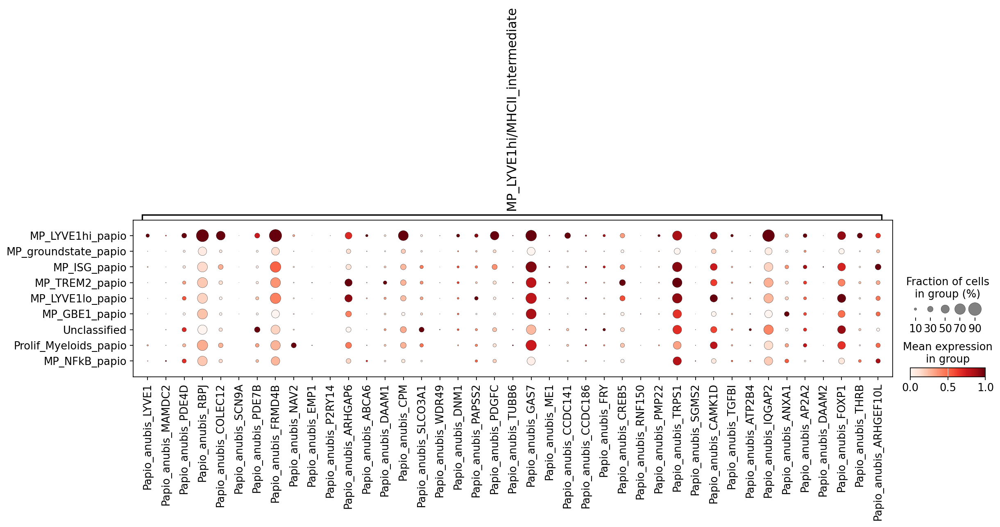

In [37]:
# Mac_LYVE1hi/MHCII_intermediate  -> Cluster 2 in MP_named_10 

marker_genes={'MP_LYVE1hi/MHCII_intermediate': ["Papio_anubis_LYVE1", "Papio_anubis_MAMDC2", "Papio_anubis_PDE4D", "Papio_anubis_RBPJ", "Papio_anubis_COLEC12", "Papio_anubis_SCN9A", "Papio_anubis_PDE7B", "Papio_anubis_FRMD4B", "Papio_anubis_NAV2", "Papio_anubis_EMP1", "Papio_anubis_P2RY14", "Papio_anubis_ARHGAP6", "Papio_anubis_ABCA6", "Papio_anubis_DAAM1", "Papio_anubis_CPM", "Papio_anubis_SLCO3A1", "Papio_anubis_WDR49", "Papio_anubis_DNM1", "Papio_anubis_PAPSS2", "Papio_anubis_PDGFC", "Papio_anubis_TUBB6", "Papio_anubis_GAS7", "Papio_anubis_ME1", "Papio_anubis_CCDC141", "Papio_anubis_CCDC186", "Papio_anubis_FRY", "Papio_anubis_CREB5", "Papio_anubis_RNF150", "Papio_anubis_PMP22", "Papio_anubis_TRPS1", "Papio_anubis_SGMS2", "Papio_anubis_CAMK1D", "Papio_anubis_TGFBI", "Papio_anubis_ATP2B4", "Papio_anubis_IQGAP2", "Papio_anubis_ANXA1", "Papio_anubis_AP2A2", "Papio_anubis_DAAM2", "Papio_anubis_FOXP1", "Papio_anubis_THRB", "Papio_anubis_ARHGEF10L"
],



    
             }
cell_types = ['MP_LYVE1hi/MHCII_intermediate']
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)



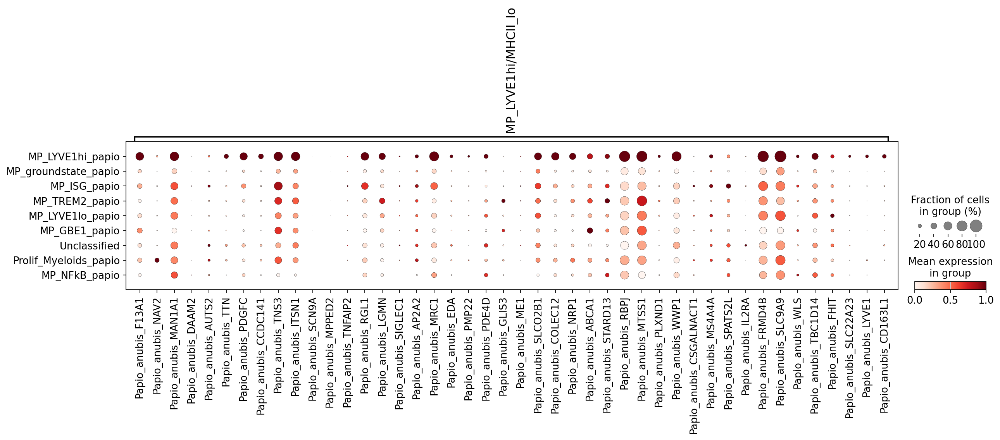

In [38]:
# Mac_LYVE1hi/MHCII_lo  -> Cluster 2 in MP_named_10

marker_genes={'MP_LYVE1hi/MHCII_lo': ["Papio_anubis_F13A1", "Papio_anubis_NAV2", "Papio_anubis_MAN1A1", "Papio_anubis_DAAM2", "Papio_anubis_AUTS2", "Papio_anubis_TTN", "Papio_anubis_PDGFC", "Papio_anubis_CCDC141", "Papio_anubis_TNS3", "Papio_anubis_ITSN1", "Papio_anubis_SCN9A", "Papio_anubis_MPPED2", "Papio_anubis_TNFAIP2", "Papio_anubis_RGL1", "Papio_anubis_LGMN", "Papio_anubis_SIGLEC1", "Papio_anubis_AP2A2", "Papio_anubis_MRC1", "Papio_anubis_EDA", "Papio_anubis_PMP22", "Papio_anubis_PDE4D", "Papio_anubis_GLIS3", "Papio_anubis_ME1", "Papio_anubis_SLCO2B1", "Papio_anubis_COLEC12", "Papio_anubis_NRP1", "Papio_anubis_ABCA1", "Papio_anubis_STARD13", "Papio_anubis_RBPJ", "Papio_anubis_MTSS1", "Papio_anubis_PLXND1", "Papio_anubis_WWP1", "Papio_anubis_CSGALNACT1", "Papio_anubis_MS4A4A", "Papio_anubis_SPATS2L", "Papio_anubis_IL2RA", "Papio_anubis_FRMD4B", "Papio_anubis_SLC9A9", "Papio_anubis_WLS", "Papio_anubis_TBC1D14", "Papio_anubis_FHIT", "Papio_anubis_SLC22A23", "Papio_anubis_LYVE1", "Papio_anubis_CD163L1"
],
    
             }
cell_types = ['MP_LYVE1hi/MHCII_lo']
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)



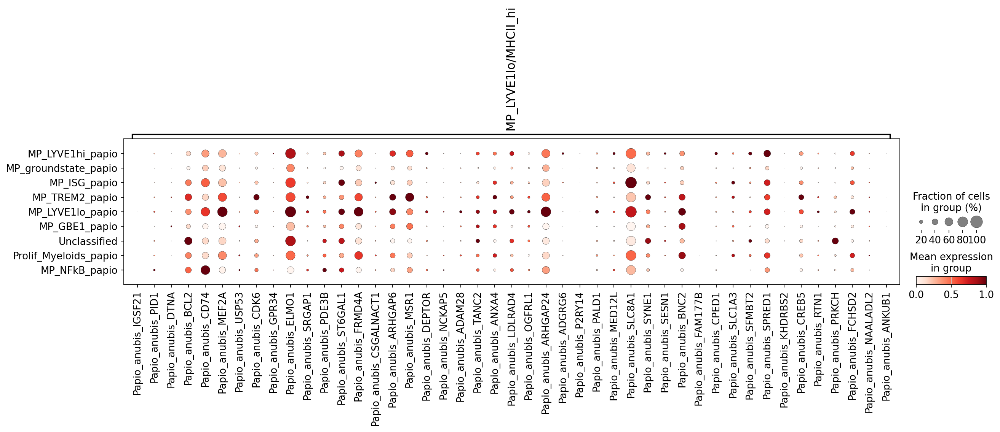

In [39]:
# Mac_LYVE1lo/MHCII_hi  -> Cluster 2 in MP_named_10

marker_genes={'MP_LYVE1lo/MHCII_hi': ['Papio_anubis_IGSF21', 'Papio_anubis_PID1', 'Papio_anubis_DTNA', 'Papio_anubis_BCL2', 'Papio_anubis_CD74', 'Papio_anubis_MEF2A', 'Papio_anubis_USP53', 'Papio_anubis_CDK6', 'Papio_anubis_GPR34', 'Papio_anubis_ELMO1', 'Papio_anubis_SRGAP1', 'Papio_anubis_PDE3B', 'Papio_anubis_ST6GAL1', 'Papio_anubis_FRMD4A', 'Papio_anubis_CSGALNACT1', 'Papio_anubis_ARHGAP6', 'Papio_anubis_MSR1', 'Papio_anubis_DEPTOR', 'Papio_anubis_NCKAP5', 'Papio_anubis_ADAM28', 'Papio_anubis_TANC2', 'Papio_anubis_ANXA4', 'Papio_anubis_LDLRAD4', 'Papio_anubis_OGFRL1', 'Papio_anubis_ARHGAP24', 'Papio_anubis_ADGRG6', 'Papio_anubis_P2RY14', 'Papio_anubis_PALD1', 'Papio_anubis_MED12L', 'Papio_anubis_SLC8A1', 'Papio_anubis_SYNE1', 'Papio_anubis_SESN1', 'Papio_anubis_BNC2', 'Papio_anubis_FAM177B', 'Papio_anubis_CPED1', 'Papio_anubis_SLC1A3', 'Papio_anubis_SFMBT2', 'Papio_anubis_SPRED1', 'Papio_anubis_KHDRBS2', 'Papio_anubis_CREB5', 'Papio_anubis_RTN1', 'Papio_anubis_PRKCH', 'Papio_anubis_FCHSD2', 'Papio_anubis_NAALADL2', 'Papio_anubis_ANKUB1'],
    
             }
cell_types = ['MP_LYVE1lo/MHCII_hi']
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)




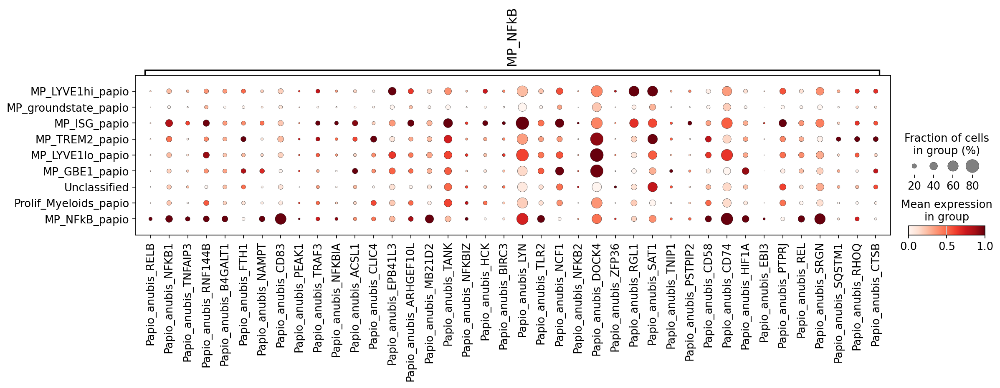

In [40]:
# Mac_NFkB  ->  cluster 4 in leiden_named_02

marker_genes={'MP_NFkB': ['Papio_anubis_RELB', 'Papio_anubis_NFKB1', 'Papio_anubis_TNFAIP3', 'Papio_anubis_RNF144B', 'Papio_anubis_B4GALT1', 'Papio_anubis_FTH1', 'Papio_anubis_NAMPT', 'Papio_anubis_CD83', 'Papio_anubis_PEAK1', 'Papio_anubis_TRAF3', 'Papio_anubis_NFKBIA', 'Papio_anubis_ACSL1', 'Papio_anubis_CLIC4', 'Papio_anubis_EPB41L3', 'Papio_anubis_ARHGEF10L', 'Papio_anubis_MB21D2', 'Papio_anubis_TANK', 'Papio_anubis_NFKBIZ', 'Papio_anubis_HCK', 'Papio_anubis_BIRC3', 'Papio_anubis_LYN', 'Papio_anubis_TLR2', 'Papio_anubis_NCF1', 'Papio_anubis_NFKB2', 'Papio_anubis_DOCK4', 'Papio_anubis_ZFP36', 'Papio_anubis_RGL1', 'Papio_anubis_SAT1', 'Papio_anubis_TNIP1', 'Papio_anubis_PSTPIP2', 'Papio_anubis_CD58', 'Papio_anubis_CD74', 'Papio_anubis_HIF1A', 'Papio_anubis_EBI3', 'Papio_anubis_PTPRJ', 'Papio_anubis_REL', 'Papio_anubis_SRGN', 'Papio_anubis_SQSTM1', 'Papio_anubis_RHOQ', 'Papio_anubis_CTSB'],

              
    
             }
cell_types = ['MP_NFkB']
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)



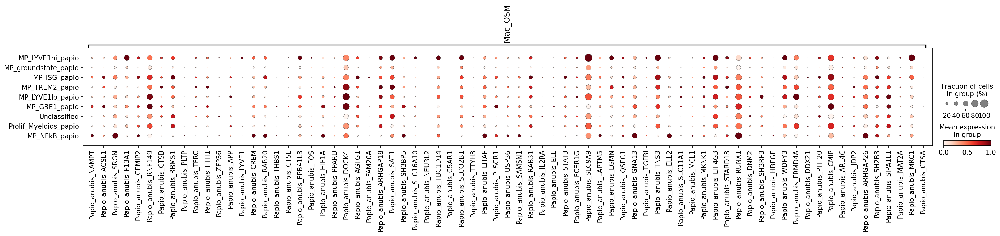

In [41]:
# Mac_OSM  -> maybe cluster ???????

marker_genes={'Mac_OSM': ['Papio_anubis_NAMPT', 'Papio_anubis_ACSL1', 'Papio_anubis_SRGN', 'Papio_anubis_F13A1', 'Papio_anubis_CEMIP2', 'Papio_anubis_RNF149', 'Papio_anubis_CTSB', 'Papio_anubis_RBMS1', 'Papio_anubis_PLTP', 'Papio_anubis_TFRC', 'Papio_anubis_FTH1', 'Papio_anubis_ZFP36', 'Papio_anubis_APP', 'Papio_anubis_LYVE1', 'Papio_anubis_CREM', 'Papio_anubis_RAB20', 'Papio_anubis_THBS1', 'Papio_anubis_CTSL', 'Papio_anubis_EPB41L3', 'Papio_anubis_FOS', 'Papio_anubis_HIF1A', 'Papio_anubis_PPARD', 'Papio_anubis_DOCK4', 'Papio_anubis_AGFG1', 'Papio_anubis_FAM20A', 'Papio_anubis_ARHGAP18', 'Papio_anubis_SAT1', 'Papio_anubis_SH3BP5', 'Papio_anubis_SLC16A10', 'Papio_anubis_NEURL2', 'Papio_anubis_TBC1D14', 'Papio_anubis_C5AR1', 'Papio_anubis_SLCO2B1', 'Papio_anubis_TTYH3', 'Papio_anubis_LITAF', 'Papio_anubis_PLSCR1', 'Papio_anubis_USP36', 'Papio_anubis_SAMSN1', 'Papio_anubis_RAB31', 'Papio_anubis_IL2RA', 'Papio_anubis_ELL', 'Papio_anubis_STAT3', 'Papio_anubis_FCER1G', 'Papio_anubis_SLC9A9', 'Papio_anubis_LAPTM5', 'Papio_anubis_LGMN', 'Papio_anubis_IQSEC1', 'Papio_anubis_GNA13', 'Papio_anubis_TGFBI', 'Papio_anubis_TNS3', 'Papio_anubis_ELL2', 'Papio_anubis_SLC11A1', 'Papio_anubis_MCL1', 'Papio_anubis_MKNK1', 'Papio_anubis_EIF4G3', 'Papio_anubis_STARD13', 'Papio_anubis_RUNX1', 'Papio_anubis_DNM2', 'Papio_anubis_SH3RF3', 'Papio_anubis_HBEGF', 'Papio_anubis_WDFY3', 'Papio_anubis_FRMD4A', 'Papio_anubis_DDX21', 'Papio_anubis_PHF20', 'Papio_anubis_CMIP', 'Papio_anubis_ARL4C', 'Papio_anubis_JDP2', 'Papio_anubis_ARHGAP26', 'Papio_anubis_SH2B3', 'Papio_anubis_SIPA1L1', 'Papio_anubis_MAT2A', 'Papio_anubis_MRC1', 'Papio_anubis_CTSA'],
             }

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)

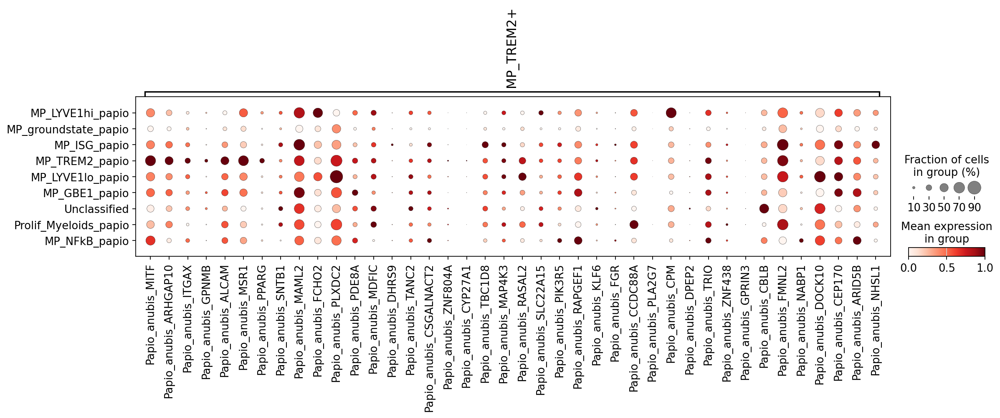

In [42]:
# Mac_TREM2+  ->  Cluster 4 in leiden_named_02 und Cluster ??????? in leiden_07

marker_genes={'MP_TREM2+': ['Papio_anubis_MITF', 'Papio_anubis_ARHGAP10', 'Papio_anubis_ITGAX', 'Papio_anubis_GPNMB', 'Papio_anubis_ALCAM', 'Papio_anubis_MSR1', 'Papio_anubis_PPARG', 'Papio_anubis_SNTB1', 'Papio_anubis_MAML2', 'Papio_anubis_FCHO2', 'Papio_anubis_PLXDC2', 'Papio_anubis_PDE8A', 'Papio_anubis_MDFIC', 'Papio_anubis_DHRS9', 'Papio_anubis_TANC2', 'Papio_anubis_CSGALNACT2', 'Papio_anubis_ZNF804A', 'Papio_anubis_CYP27A1', 'Papio_anubis_TBC1D8', 'Papio_anubis_MAP4K3', 'Papio_anubis_RASAL2', 'Papio_anubis_SLC22A15', 'Papio_anubis_PIK3R5', 'Papio_anubis_RAPGEF1', 'Papio_anubis_KLF6', 'Papio_anubis_FGR', 'Papio_anubis_CCDC88A', 'Papio_anubis_PLA2G7', 'Papio_anubis_CPM', 'Papio_anubis_DPEP2', 'Papio_anubis_TRIO', 'Papio_anubis_ZNF438', 'Papio_anubis_GPRIN3', 'Papio_anubis_CBLB', 'Papio_anubis_FMNL2', 'Papio_anubis_NABP1', 'Papio_anubis_DOCK10', 'Papio_anubis_CEP170', 'Papio_anubis_ARID5B', 'Papio_anubis_NHSL1'],
              
             }

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)




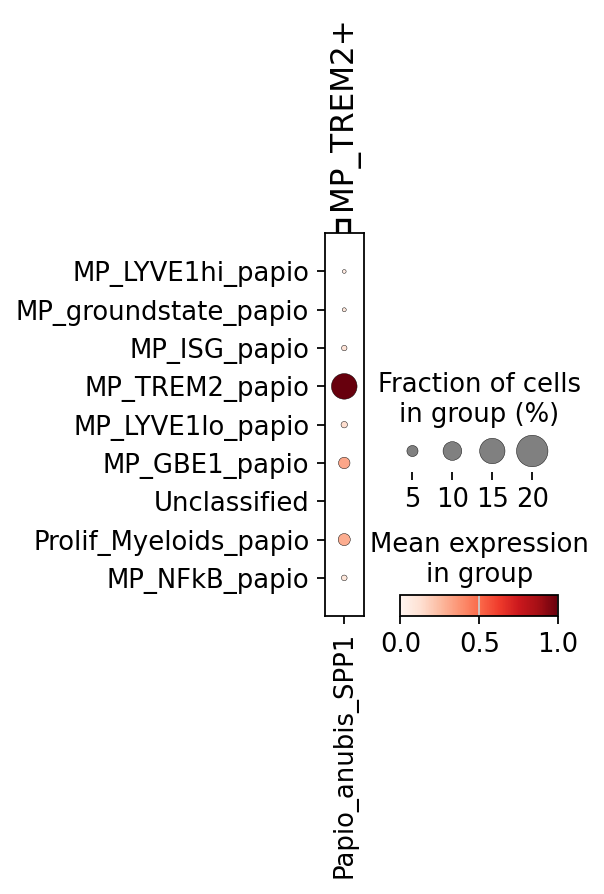

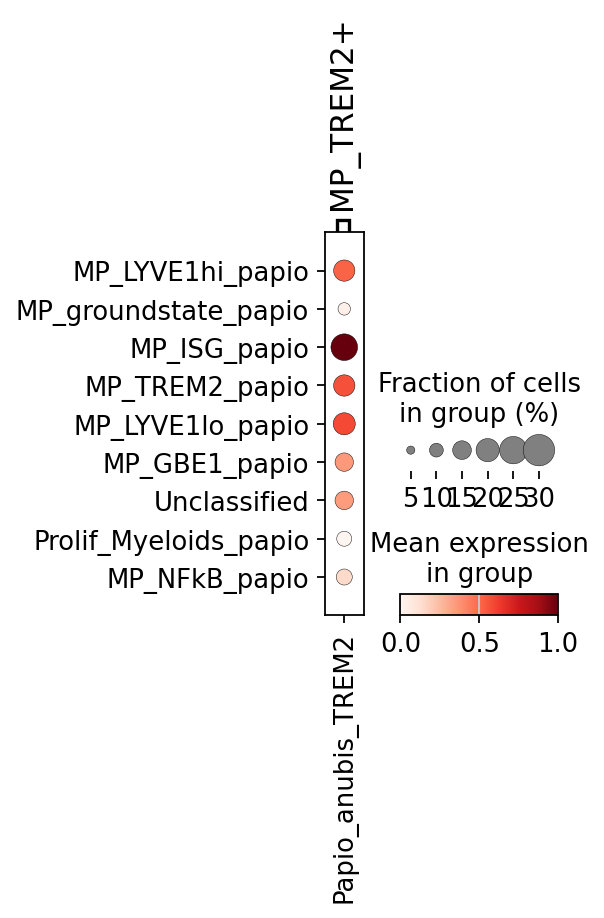

In [43]:
# Mac_TREM2+  ->  Cluster 4 in leiden_named_02 und Cluster ??????? in leiden_07

marker_genes={'MP_TREM2+': ['Papio_anubis_SPP1'],
              
             }

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)

marker_genes={'MP_TREM2+': ['Papio_anubis_TREM2'],
              
             }

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)

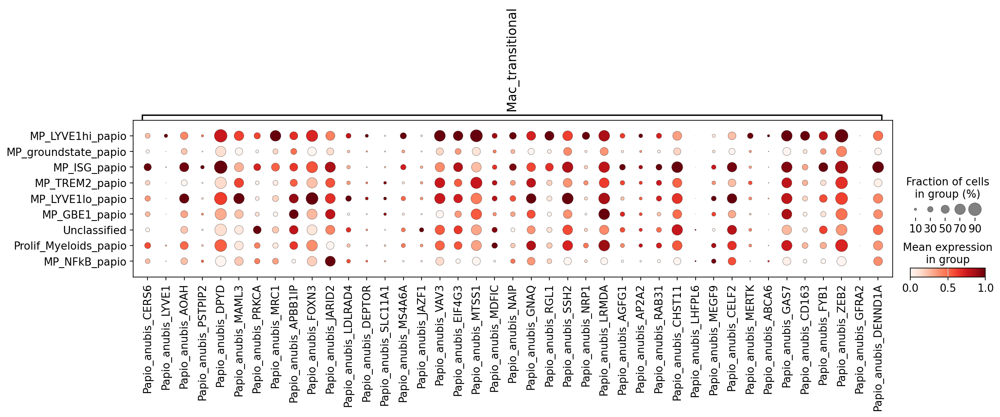

In [44]:
# Mac_transitional  ->  Cluster ???? in leiden_named_02 und Cluster ??????? in leiden_07

marker_genes={'Mac_transitional': ['Papio_anubis_CERS6', 'Papio_anubis_LYVE1', 'Papio_anubis_AOAH', 'Papio_anubis_PSTPIP2', 'Papio_anubis_DPYD', 'Papio_anubis_MAML3', 'Papio_anubis_PRKCA', 'Papio_anubis_MRC1', 'Papio_anubis_APBB1IP', 'Papio_anubis_FOXN3', 'Papio_anubis_JARID2', 'Papio_anubis_LDLRAD4', 'Papio_anubis_DEPTOR', 'Papio_anubis_SLC11A1', 'Papio_anubis_MS4A6A', 'Papio_anubis_JAZF1', 'Papio_anubis_VAV3', 'Papio_anubis_EIF4G3', 'Papio_anubis_MTSS1', 'Papio_anubis_MDFIC', 'Papio_anubis_NAIP', 'Papio_anubis_GNAQ', 'Papio_anubis_RGL1', 'Papio_anubis_SSH2', 'Papio_anubis_NRP1', 'Papio_anubis_LRMDA', 'Papio_anubis_AGFG1', 'Papio_anubis_AP2A2', 'Papio_anubis_RAB31', 'Papio_anubis_CHST11', 'Papio_anubis_LHFPL6', 'Papio_anubis_MEGF9', 'Papio_anubis_CELF2', 'Papio_anubis_MERTK', 'Papio_anubis_ABCA6', 'Papio_anubis_GAS7', 'Papio_anubis_CD163', 'Papio_anubis_FYB1', 'Papio_anubis_ZEB2', 'Papio_anubis_GFRA2', 'Papio_anubis_DENND1A'], 

    
             }

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)

 


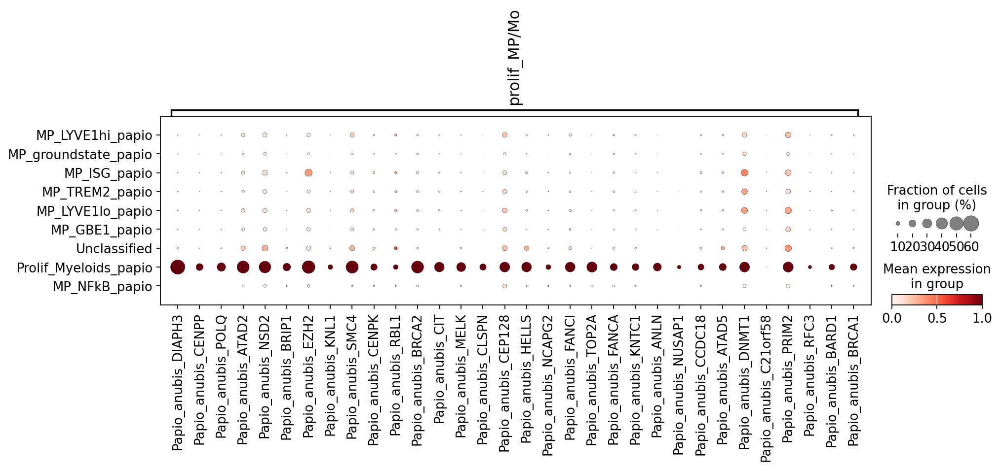

In [45]:
# proliferating_Myeloids  ->  Maybe proliferating MPs?

marker_genes={'prolif_MP/Mo': ["Papio_anubis_DIAPH3", "Papio_anubis_CENPP", "Papio_anubis_POLQ", "Papio_anubis_ATAD2", "Papio_anubis_NSD2", "Papio_anubis_BRIP1", "Papio_anubis_EZH2", "Papio_anubis_KNL1", "Papio_anubis_SMC4", "Papio_anubis_CENPK", "Papio_anubis_RBL1", "Papio_anubis_BRCA2", "Papio_anubis_CIT", "Papio_anubis_MELK", "Papio_anubis_CLSPN", "Papio_anubis_CEP128", "Papio_anubis_HELLS", "Papio_anubis_NCAPG2", "Papio_anubis_FANCI", "Papio_anubis_TOP2A", "Papio_anubis_FANCA", "Papio_anubis_KNTC1", "Papio_anubis_ANLN", "Papio_anubis_NUSAP1", "Papio_anubis_CCDC18", "Papio_anubis_ATAD5", "Papio_anubis_DNMT1", "Papio_anubis_C21orf58", "Papio_anubis_PRIM2", "Papio_anubis_RFC3", "Papio_anubis_BARD1", "Papio_anubis_BRCA1"],

              
              
             }

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1

)


# Annotation according DCM and membrane/secreted proteins

In [ ]:
sc.pl.umap(adata, color=["MP_named_06"])

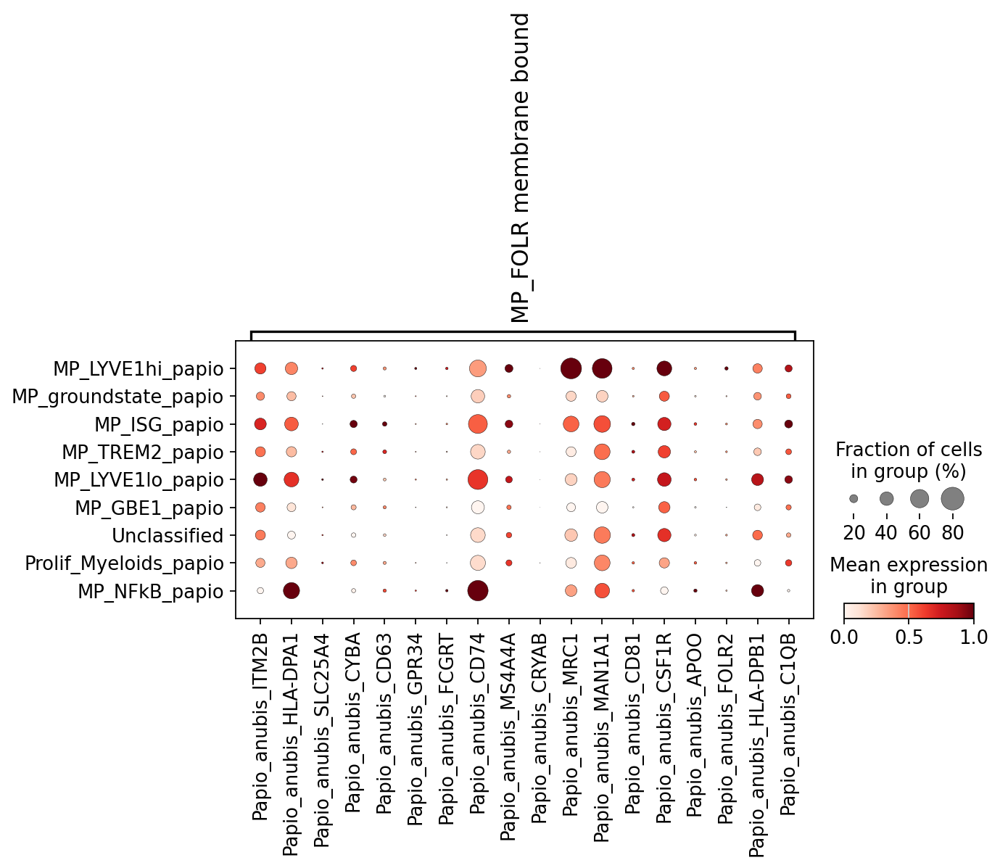

In [47]:
# MP_FLOR membrane bound -> cluster 

marker_genes={ 'MP_FOLR membrane bound': ["Papio_anubis_ITM2B", "Papio_anubis_HLA-DPA1", "Papio_anubis_SLC25A4", "Papio_anubis_CYBA", "Papio_anubis_CD63", "Papio_anubis_GPR34", "Papio_anubis_FCGRT", "Papio_anubis_CD74", "Papio_anubis_MS4A4A", "Papio_anubis_CRYAB", "Papio_anubis_MRC1", "Papio_anubis_MAN1A1", "Papio_anubis_CD81", "Papio_anubis_CSF1R", "Papio_anubis_APOO", "Papio_anubis_FOLR2", "Papio_anubis_HLA-DPB1", "Papio_anubis_C1QB"

                                         
                                         
                                         ]}
cell_types = ['MP_FOLR membrane bound']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)


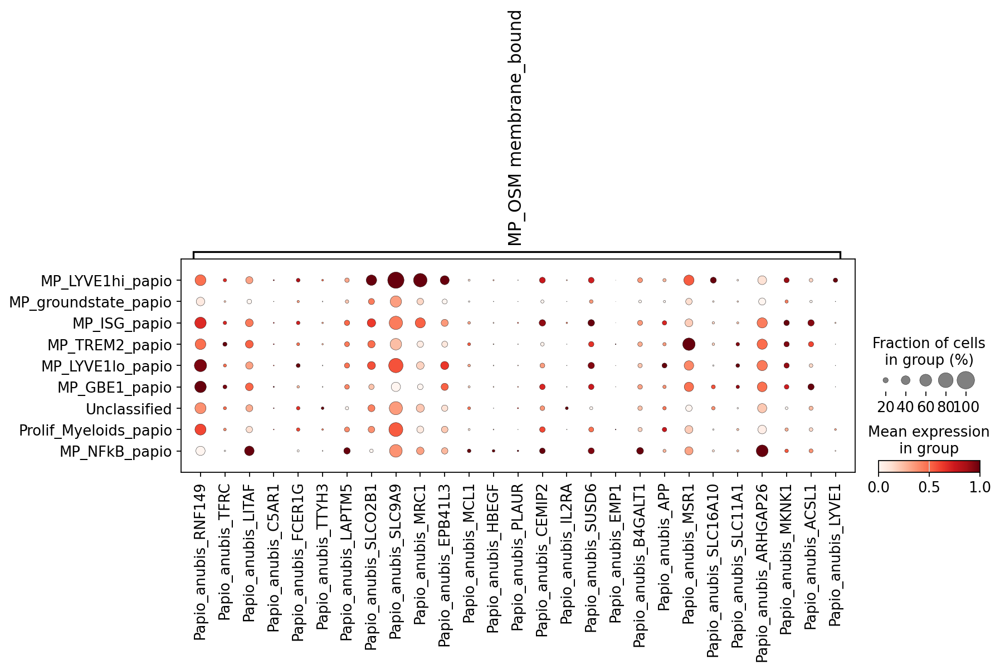

In [48]:
# MP_OSM membrane bound -> cluster

marker_genes={ 'MP_OSM membrane_bound': ["Papio_anubis_RNF149", "Papio_anubis_TFRC", "Papio_anubis_LITAF", "Papio_anubis_C5AR1", "Papio_anubis_FCER1G", "Papio_anubis_TTYH3", "Papio_anubis_LAPTM5", "Papio_anubis_SLCO2B1", "Papio_anubis_SLC9A9", "Papio_anubis_MRC1", "Papio_anubis_EPB41L3", "Papio_anubis_MCL1", "Papio_anubis_HBEGF", "Papio_anubis_PLAUR", "Papio_anubis_CEMIP2", "Papio_anubis_IL2RA", "Papio_anubis_SUSD6", "Papio_anubis_EMP1", "Papio_anubis_B4GALT1", "Papio_anubis_APP", "Papio_anubis_MSR1", "Papio_anubis_SLC16A10", "Papio_anubis_SLC11A1", "Papio_anubis_ARHGAP26", "Papio_anubis_MKNK1", "Papio_anubis_ACSL1", "Papio_anubis_LYVE1"

                                         
                                         
                                         ]}
cell_types = ['MP_OSM membrane_bound']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)

    

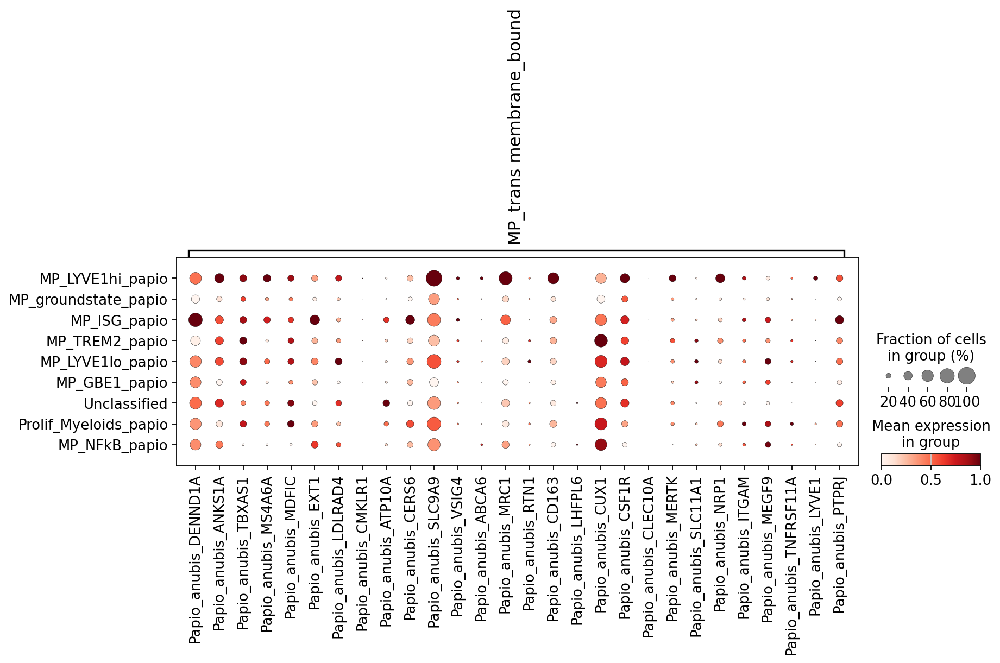

In [49]:
# MP_trans membrane_bound -> cluster

marker_genes={ 'MP_trans membrane_bound': ["Papio_anubis_DENND1A", "Papio_anubis_ANKS1A", "Papio_anubis_TBXAS1", "Papio_anubis_MS4A6A", "Papio_anubis_MDFIC", "Papio_anubis_EXT1", "Papio_anubis_LDLRAD4", "Papio_anubis_CMKLR1", "Papio_anubis_ATP10A", "Papio_anubis_CERS6", "Papio_anubis_SLC9A9", "Papio_anubis_VSIG4", "Papio_anubis_ABCA6", "Papio_anubis_MRC1", "Papio_anubis_RTN1", "Papio_anubis_CD163", "Papio_anubis_LHFPL6", "Papio_anubis_CUX1", "Papio_anubis_CSF1R", "Papio_anubis_CLEC10A", "Papio_anubis_MERTK", "Papio_anubis_SLC11A1", "Papio_anubis_NRP1", "Papio_anubis_ITGAM", "Papio_anubis_MEGF9", "Papio_anubis_TNFRSF11A", "Papio_anubis_LYVE1", "Papio_anubis_PTPRJ"

                                         
                                         
                                         ]}
cell_types = ['MP_trans membrane_bound']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="MP_named_10",
    var_names=marker_genes,
    standard_scale="var"  #, save='genes_per_cell_type_1.png' # standard scale: normalize each gene to range from 0 to 1
)
